## Importing Libraries and custom functions


In [1]:
import numpy as np
import pylab as plt
from numpy import fft

from astropy.cosmology import Planck15, default_cosmology
from astropy import constants as const
from astropy import units as un
from astropy.coordinates import SkyCoord
# import h5py
# from scipy import signal
from astropy.io import ascii, fits

fft = np.fft.fft
fft2 = np.fft.fft2
ifft2 = np.fft.ifft2
fftshift = np.fft.fftshift
ifftshift = np.fft.ifftshift

## Defining the cosmology - Planck15 of astropy
cosmo = Planck15
f21 = 1420.405752 * un.MHz # MHz
c = const.c.value # m/s
print('The 21 cm line emission freq - ',f21)

The 21 cm line emission freq -  1420.405752 MHz


In [2]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
from matplotlib.colors import LogNorm
%matplotlib inline

plt.rc('font', family='serif', weight='normal', size=22.0)
# plt.rc('xtick', labelsize='x-small')
# plt.rc('ytick', labelsize='x-small')

import copy
COLORMAP = copy.copy(matplotlib.cm.__dict__["inferno"])
COLORMAP.set_under("black")
COLORMAP.set_bad("lightgray")

In [3]:
import os

In [4]:
def delay_to_kpara(delay, z, cosmo=None):
    """Conver delay in sec unit to k_parallel (comoving 1./Mpc along line of sight).

    Parameters
    ----------
    delay : Astropy Quantity object with units equivalent to time.
        The inteferometric delay observed in units compatible with time.
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to planck2015 year in "little h" units

    Returns
    -------
    kparr : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale parallel to the line of sight probed by the input delay (eta).

    """

    
    if cosmo is None:
        cosmo = default_cosmology.get()
    return (delay * (2 * np.pi * cosmo.H0 * f21 * cosmo.efunc(z))
            / (const.c * (1 + z)**2)).to('1/Mpc')

def kpara_to_delay(kpara, z, cosmo=None):
    """Convert k_parallel (comoving 1/Mpc along line of sight) to delay in sec.

    Parameters
    ----------
    kpara : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale parallel to the line of sight
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to WMAP9 year in "little h" units

    Returns
    -------
    delay : Astropy Quantity units equivalent to time
        The inteferometric delay which probes the spatial scale given by kparr.

    """

    
    if cosmo is None:
        cosmo = default_cosmology.get()
    return (kpara * const.c * (1 + z)**2
            / (2 * np.pi * cosmo.H0 * f21 * cosmo.efunc(z))).to('s')

def kperp_to_u(kperp, z, cosmo=None):
    """Convert comsological k_perpendicular to baseline length u (wavelength unit).

    Parameters
    ----------
    kperp : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale perpendicular to the line of sight.
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to WMAP9 year in "little h" units

    Returns
    -------
    u : float
        The baseline separation of two interferometric antennas in units of
        wavelength which probes the spatial scale given by kperp

    """
    if cosmo is None:
        cosmo = default_cosmology.get()
    return kperp * cosmo.comoving_transverse_distance(z) / (2 * np.pi)

def u_to_kperp(u, z, cosmo=None):
    """Convert baseline length u to k_perpendicular.

    Parameters
    ----------
    u : float
        The baseline separation of two interferometric antennas in units of wavelength
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to WMAP9 year in "little h" units

    Returns
    -------
    kperp : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale perpendicular to the line of sight probed by the baseline length u.

    """
    if cosmo is None:
        cosmo = default_cosmology.get()
    return 2 * np.pi * u / cosmo.comoving_transverse_distance(z)

def get_spatial_kmodes(Nx,Ny,theta_res,edshift):
    """Estimate the spatial fourier k-modes, (kx and ky) and the gridded u,v coordinates.  
    
    Parameteres
    -----------
    Nx : int
     Number of cells along RA or X-axis direction.
    Ny : int
      Number of cells along DEC or Y-axis direction.
    theta_res : float 
      The cell size of the map in radian unit.
    redshift : float
      redshift at the centre of the band.
    
    Returns
    -------
    k_x : np.ndarray[nra]
     spatial fourier modes along X-axis 
    k_y : np.ndarray[nel]
     spatial fourier modes along Y-axis
    u : np.ndarray[nra]
     gridded u-coordinates 
    v : np.ndarray[nel]
     gridded v-coordinates
    """
    DMz = cosmo.comoving_transverse_distance(redshift).value # in Mpc
    dtheta_Mpc =  DMz * theta_res   # res (radian) to Mpc unit
    k_x = 2*np.pi * (np.fft.fftfreq(Nx, d=dtheta_Mpc)) # [Mpc^-1] The kx coordinates along the X-direction
    k_y = 2*np.pi * (np.fft.fftfreq(Ny, d=dtheta_Mpc)) # [Mpc^-1] The ky coordinates along the Y-direction
   
    k_x = np.fft.fftshift(k_x)
    k_y = np.fft.fftshift(k_y)
    
    u = (DMz * k_x)/(2*np.pi)
    v = (DMz * k_y)/(2*np.pi)
    return k_x,k_y, u, v

def jy_per_beam_to_kelvin(freq,beam_area=1.0):
    """Conversion factor from Jy/beam to kelvin unit.
    
    The conversion factor is C = (10**-26 * lambda**2)/(2 * K_boltzmann * omega_PSF), 
    where omega_PSF is the beam area in sr unit.
    
    Parameters
    ----------
    freq : np.ndarray[nfreq]
        frequency in MHz unit
    beam_area : float
        synthesized beam area in sr unit
        
    Returns
    -------
    C : np.ndarray[nfreq]
     The conversion factor from Jy/beam to Kelvin
    """
 
    Jy = 1.0e-26 # W m^-2 Hz^-1
    c = const.c.value # m/s
    wl = c/(freq*1e6) # freq of the map in MHz
    kB = const.k_B.value # Boltzmann Const in J/k (1.38 * 10-23)
    C = (wl**2 * Jy) / (2*kB *beam_area)
    return C 

def image_to_uv(data_cube,window=True,window_name ='tukey', alpha=0.5, axes=None):
    """Spatial FFT along RA and DEC axes of the data cube.
    
    Parameters
    ----------
    data_cube : np.ndarray[nfreq,nra,nel]
       The data cube, whose spatial FFT will be computed along RA and DEC axes.
    window : bool.
       If True apply a spatial apodisation function. Default: True.
    window_name : 'Tukey'
       Apply Tukey spatial tapering window. Default: 'Tukey'.
    alpha : float 
       Shape parameter of the Tukey window. 
       0 = rectangular window, 1 = Hann window. We are taking 0.5 (default), which lies in between. 
    axes : Tuple.
      The axes along which to do the 2D Spatial FFT. This is the RA and DEC axex of the data cube. 
      
    Returns
    -------
      data_cube : np.ndarray[nfreq,nra,nel]
         The 2D spatial FFT of the data cube in (u,v) domain.
    """
    from scipy.signal import windows
    FT_norm = 1 / float(np.prod(np.array(data_cube.shape)[list(axes)]))
    print(f"Fourier Norm : {FT_norm}")            
    if window:
        window_func = getattr(windows, window_name)
        w_ra = window_func(data_cube.shape[axes[0]],alpha=alpha)   # taper in the RA direction 
        w_dec = window_func(data_cube.shape[axes[1]],alpha=alpha)  # taper in the DEC direction
        taper_window = np.outer(w_ra[:,np.newaxis],w_dec[np.newaxis,:]) # Make the 2D tapering function by taking the outer product 
        print(f'Taper window shape : {taper_window.shape}')
        data_cube *=  taper_window[np.newaxis,:,:]
              
    uv_map = np.fft.fftshift(np.fft.fft2(np.fft.ifftshift(data_cube, axes=axes), axes=axes), axes=axes)
     
    return uv_map * FT_norm

def get_ps(vis_cube_1, vis_cube_2 , vol_norm_factor):
    """Estimate the cross-correlation of two data cubes,
    and normalize it. If a single data cube is 
    provided, then estimate the auto-correlation.
    
    The data cubes are complex. This will estimate the cross-correlation
    of two complex data cubes and return the real part of that.
    
    Parameters
    ----------
    vis_cube_1 : np.ndarray[nfreq,Nx,Ny]
      complex data cube in (tau,u,v) domain.
    vis_cube_2 : np.ndarray[nfreq,Nx,Ny]
      complex data cube in (tau,u,v) domain. 
    vol_norm_factor : float
      power spectrum normalization factor in [Mpc^3]
    
    Return
    ------
    ps_cube_real: np.ndarray[nfreq,Nx,Ny]
       The real part of the power spectrum
    """
    if vis_cube_1 is None and vis_cube_2 is None:
        raise NameError('Atleast one map must be provided')
      
    if vis_cube_2 is None:
        print('correlate the vis cube with itself')
        ps_cube_real = (np.conj(vis_cube_1) * vis_cube_1).real
        
    else:
        print('correlate the vis cube 1 with vis cube 2')
        ps_cube_real = (vis_cube_1 * np.conj(vis_cube_2)).real
        
    return ps_cube_real*vol_norm_factor

def is_odd(num):
    return num & 0x1

def PS2D(ps_cube,weight_cube,kperp_bins,kpar_bins,kpar,uu,vv,redshift,fold=True):
    """Estimate the cylindrically averaged 2D power spectrum. 
    
     Parameters
     ----------
     ps_cube : np.ndarray[nfreq,nra*nel] 
       The power spectrum array to average in cylindrical bins.
     weight_cube : np.ndarray[nfreq,nra,nel]
       The inverse variance weight, to be used in averaging. 
     kperp_min : float
       The min value of the bin in k-perpendicular direction; unit 1/Mpc 
     kperp_min : float
       The max value of the bin in k-perpendicular direction; unit 1/Mpc 
     kpar : np.ndarray[nfreq]
       The k_parallel array, unit 1/Mpc 
     uu : np.ndarray[nra]
      The u-coordinate in wavelength.
     vv : np.ndarray[nel] 
       The v-coordinate in wavelength.
     redshift : float
       The redshift corresponding to the band center.
     Nbins_2D : int
       The number of bins in k-perpendicualr direction
     log_bins : bool
       Bins in logarithmic space. Default : True. 
            
    Returns
    -------
    ps_2D : np.ndarray[] = 
      The cylindrically avg 2D Power of shape (k_par,k_perp) with unit [K^2 Mpc^3] 
    k_perp : np.array[Nbins_2d]
     The k_perp array after binning.
    k_para : np.array[nfreq//2]
     The k_parallel array, only the positive half. 
    """
    
   
    # Set weights
    
    if weight_cube is not None:
        # Inverse variance weighting, here weight_cube = 1/sigma, so we are squaring it to get variance
        print('Using inverse variance weighting')
        w = weight_cube ** 2 
    else:
        print('Using unit uniform weighting')
        w = np.ones_like(ps_cube) # Unit uniform weight.  
        
        
#     # Choosing the bins
#     if log_bins:
#         print(f'Using logarithmic binning in k_perp between {kperp_min} and {kperp_max}')
#         kp = np.logspace(np.log10(kperp_min), np.log10(kperp_max),Nbins_2D+1) 
#     else:
#         print(f'Using linear binning in k_perp between {kperp_min} and {kperp_max}')
#         kp = np.linspace(kperp_min, kperp_max,Nbins_2D+1)
                                 
    kp = kperp_bins
    # Find the bin indices and determine which radial bin each cell lies in.

    ku = u_to_kperp(uu,redshift) #convert the u-array to fourier modes
    kv = u_to_kperp(vv,redshift) #convert the v-array to fourier modes
    
    ru = np.sqrt(ku.value** 2 + kv.value ** 2) 
    
    # Digitize the bins
    bin_indx = np.digitize(ru, bins=kp) 
    print(bin_indx.shape)
    
    # Define empty list to store the binned 2D PS
    
    ps_2D = []
    ps_2D_err = [] 
    ps_2D_w = []
    
    # Now bin in 2D ##
    with np.errstate(divide='ignore', invalid='ignore'):
        for i in np.arange(len(kp)) + 1:
            p = np.nansum(w[:, bin_indx == i] * ps_cube[:, bin_indx == i], axis=1) / np.sum(w[:, bin_indx == i], axis=1)
            p_err = np.sqrt(2 * np.sum(w[:, bin_indx == i] ** 2 * p[:, None] **
                                       2, axis=1) / np.sum(w[:, bin_indx == i], axis=1) ** 2)

            ps_2D.append(p)
            ps_2D_err.append(p_err)
            ps_2D_w.append(np.sum(w[:, bin_indx == i], axis=1))
            
    ps_2D =  np.array(ps_2D).T 
    ps_2D_w =  np.array(ps_2D_w).T
    ps_2D_err = np.array(ps_2D_err).T

    if fold:
        M = len(kpar)
        k_par = kpar[M // 2 + 1:]
        if is_odd(M):
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[:M // 2][::-1]
        else:
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[1:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[1:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[1:M // 2][::-1]

    # Digitize the kpar bins
    bin_indx_kpar = np.digitize(k_par, bins=kpar_bins)
    ps_2d = []
    ps_2d_err = [] 
    ps_2d_w = []
    
    # Now bin in kpar ##
    with np.errstate(divide='ignore', invalid='ignore'):
        for i in np.arange(len(kpar_bins)) + 1:
            p = np.nansum(ps2D_w_fold[bin_indx_kpar == i,:] * ps2D_fold[bin_indx_kpar == i,:], axis=0) / np.sum(ps2D_w_fold[bin_indx_kpar == i,:], axis=0)
            
            p_err = np.sqrt(2 * np.sum(ps2D_w_fold[bin_indx_kpar == i,:] ** 2 * p[None,:] **
                                       2, axis=0) / np.sum(ps2D_w_fold[bin_indx_kpar == i,:], axis=0) ** 2)

            ps_2d.append(p)
            ps_2d_err.append(p_err)
            ps_2d_w.append(np.sum(ps2D_w_fold[bin_indx_kpar == i,:], axis=0))
        
    return kp, kpar_bins, np.array(ps_2d), np.array(ps_2d_w), np.array(ps_2d_err)

def PS2D_no_kpar_bin(ps_cube,weight_cube,kperp_min,kperp_max,kpar,uu,vv,redshift,fold=True,
                    Nbins_2D=30,log_bins=False):
    """Estimate the cylindrically averaged 2D power spectrum. 
    
     Parameters
     ----------
     ps_cube : np.ndarray[nfreq,nra*nel] 
       The power spectrum array to average in cylindrical bins.
     weight_cube : np.ndarray[nfreq,nra,nel]
       The inverse variance weight, to be used in averaging. 
     kperp_min : float
       The min value of the bin in k-perpendicular direction; unit 1/Mpc 
     kperp_min : float
       The max value of the bin in k-perpendicular direction; unit 1/Mpc 
     kpar : np.ndarray[nfreq]
       The k_parallel array, unit 1/Mpc 
     uu : np.ndarray[nra]
      The u-coordinate in wavelength.
     vv : np.ndarray[nel] 
       The v-coordinate in wavelength.
     redshift : float
       The redshift corresponding to the band center.
     Nbins_2D : int
       The number of bins in k-perpendicualr direction
     log_bins : bool
       Bins in logarithmic space. Default : True. 
            
    Returns
    -------
    ps_2D : np.ndarray[] = 
      The cylindrically avg 2D Power of shape (k_par,k_perp) with unit [K^2 Mpc^3] 
    k_perp : np.array[Nbins_2d]
     The k_perp array after binning.
    k_para : np.array[nfreq//2]
     The k_parallel array, only the positive half. 
    """
    
   
    # Set weights
    
    if weight_cube is not None:
        # Inverse variance weighting, here weight_cube = 1/sigma, so we are squaring it to get variance
        print('Using inverse variance weighting')
        w = weight_cube ** 2 
    else:
        print('Using unit uniform weighting')
        w = np.ones_like(ps_cube) # Unit uniform weight.  
        
        
    # Choosing the bins
    if log_bins:
        print(f'Using logarithmic binning in k_perp between {kperp_min} and {kperp_max}')
        kp = np.logspace(np.log10(kperp_min), np.log10(kperp_max),Nbins_2D+1) 
    else:
        print(f'Using linear binning in k_perp between {kperp_min} and {kperp_max}')
        kp = np.linspace(kperp_min, kperp_max,Nbins_2D+1)
                                 
   # kp = kperp_bins
    # Find the bin indices and determine which radial bin each cell lies in.

    ku = u_to_kperp(uu,redshift) #convert the u-array to fourier modes
    kv = u_to_kperp(vv,redshift) #convert the v-array to fourier modes
    
    ru = np.sqrt(ku.value** 2 + kv.value ** 2) 
    
    # Digitize the bins
    bin_indx = np.digitize(ru, bins=kp) 
    print(bin_indx.shape)
    
    # Define empty list to store the binned 2D PS
    
    ps_2D = []
    ps_2D_err = [] 
    ps_2D_w = []
    
    # Now bin in 2D ##
    with np.errstate(divide='ignore', invalid='ignore'):
        for i in np.arange(len(kp)) + 1:
            p = np.nansum(w[:, bin_indx == i] * ps_cube[:, bin_indx == i], axis=1) / np.sum(w[:, bin_indx == i], axis=1)
            p_err = np.sqrt(2 * np.sum(w[:, bin_indx == i] ** 2 * p[:, None] **
                                       2, axis=1) / np.sum(w[:, bin_indx == i], axis=1) ** 2)

            ps_2D.append(p)
            ps_2D_err.append(p_err)
            ps_2D_w.append(np.sum(w[:, bin_indx == i], axis=1))
            
    ps_2D =  np.array(ps_2D).T 
    ps_2D_w =  np.array(ps_2D_w).T
    ps_2D_err = np.array(ps_2D_err).T

    if fold:
        M = len(kpar)
        k_par = kpar[M // 2 + 1:]
        if is_odd(M):
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[:M // 2][::-1]
        else:
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[1:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[1:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[1:M // 2][::-1]
            
        return kp, k_par, np.array(ps2D_fold), np.array(ps2D_w_fold), np.array(ps2D_err_fold) 

        
    return kp, kpar, np.array(ps_2d), np.array(ps_2d_w), np.array(ps_2d_err)

def reshape_data_cube(data_cube,u,v,bl_min,bl_max):
    """Keep non-zero visibility cube between min and max baslines (in wavelength unit).
    
    For each delay channel, it will keep the non-zero visibilities between min and max 
    baseline length and flatten the array.
    
    Parameters
    ----------
    data_cube : np.ndarray[nfreq,Nx,Ny]
     The data cube to reshape and flatten.
    u : np.ndarray[Nx]
     The u-coordinates in wavelength unit.
    v : np.ndarray[Ny]
     The v-coordinates in wavelength unit. 
    bl_min : float
     The min baseline length in wavelength unit.
    bl_max : float
     The max baseline length in wavelength unit.
     
    Returns
    -------
    ft_cube : np.ndarray[nfreq,nvis]
     The flatten data cube.
    uu : np.ndarray[nvis]
     The flatten u-coordinates
    vv : np.ndarray[nvis]
     The flatten v-coordinates
    """
    g_uu, g_vv = np.meshgrid(v, u)
    print(f'Gridded data cube shape in kx and ky direction - {g_uu.shape}') 
    g_ru = np.sqrt(g_uu ** 2 + g_vv ** 2)
    bl_idx = (g_ru >= bl_min) & (g_ru <= bl_max)
    uu = g_uu[bl_idx]
    vv = g_vv[bl_idx] 
    
    ft_cube = []
    for ii in range(data_cube.shape[0]):
        ft = data_cube[ii,:,:]
        ft_cube.append(ft[bl_idx].flatten())
        
    return np.array(ft_cube),uu.flatten(), vv.flatten() 

def vol_normalization_vis(Nx,Ny,Nz,theta_res,redshift,chan_width):
    """Estimate the volume normalization factor for the power spectrum.
    
    Parameters
    ----------
    Nx : int
     Number of cells along RA or X-axis direction.
    Ny : int
      Number of cells along DEC or Y-axis direction.
    Nz : int
      Number of samples along freq or Z- axis direction.
    theta_res : float 
      The cell size  in radian unit.
    redshift : float
      redshift at the centre of the band.
    chan_width : float
       channel width in MHz unit.
    
    Returns
    -------
    norm : float
      The  PS normalization factor in Mpc^3 unit
    """
    DMz = cosmo.comoving_transverse_distance(redshift).value # in Mpc
    
    # Along spatial direction 
    dtheta_Mpc =  DMz * theta_res  # res (radian) to Mpc unit
    Lx = (Nx*dtheta_Mpc)  #survey length in RA/X-axis [Mpc]
    Ly = (Ny*dtheta_Mpc) # survey length in DEC/Y-axis [Mpc]
     
    ## Along line-of-sight direction  
    f21 = 1420.405752 * un.MHz # MHz
    c = const.c.to("km/s").value # [km/s]
    Hz = cosmo.H(redshift).value  # [km/s/Mpc]
    d_z = c * (1+redshift)**2 * chan_width / Hz / f21.value  #[Mpc] The sampling interval along the Z line-of-sight dimension Reference: Ref.[liu2014].Eq.(A9)
    Lz = d_z * Nz  #The linear size in z-direction [Mpc]
    

    print(f'Linear size in X-direction = {Lx} Mpc')
    print(f'Linear size in Y-direction = {Ly} Mpc')
    print(f'Linear size in Z-direction = {Lz} Mpc')
    
    norm = (Lx * Ly * Lz)
    print(f'Power Spectrum normalization factor  value - {norm} Mpc^3')
    
    return norm


# Load Data

In [5]:
path = '/scratch/anshuman/Eeshan'
# # image = np.array(hdu.data[:])
hdu = fits.open(os.path.join(path,'Band5_Data/SKA_data_sub_5_166_180.9_MHz.fits'))[0]
# # hdu = fits.open(os.path.join(path,'Samit_Data/TRecs_g_0.001/SKA_MODEL_SKY_2MIN_30MIN_z_7.305_g_0.001_r_0.5.fits'))[0]
hdr = hdu.header
print(hdr)
image= np.array(hdu.data[:])

# image = np.load(os.path.join(path,'PCA3_Data/PCA3_150x2048x2048/pca3_pbcorrect_150x2048x2048.npy'))

# image = np.swapaxes(image,0,2)
# image = np.load(os.path.join(path,'GPR_Data/GPR_150x2048x2048.npy'))
print(image.shape)

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -32 / array data type                                NAXIS   =                    3 / number of array dimensions                     NAXIS1  =                 2048                                                  NAXIS2  =                 2048                                                  NAXIS3  =                  150                                                  COMMENT   FITS (Flexible Image Transport System) format is defined in 'AstronomyCOMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H BUNIT   = 'JY/BEAM '           / Units are in Jansky per beam                   BMAJ    =   0.0553607952110976                                                  BMIN    =   0.0411477702279064                                                  BPA     =     131.557864066282                                                  EQUINOX =                2000. / J2000  

In [6]:
nfreq,Nx,Ny = image.shape

In [7]:
# #Normalising images
# for i in range(len(image)):
#     image[i,:,:] = (image[i,:,:]-np.mean(image[i,:,:]))#/(np.max(image[i,:,:])-np.min(image[i,:,:]))

In [8]:
# hdu_true = fits.open(os.path.join(path,'Samit_Data/HI_signal_Reion_Yuga/HI_CUBE_z_7.305.fits'))[0]
hdu_true = fits.open(os.path.join(path,'PCA3_Data/True_HI_150x2048x2048/TestDataset.msn_image.fits'))[0]
hdr_true = hdu_true.header
image_1 = np.array(hdu_true.data[:])[:-1]
print(image_1.shape)
# image_1 = np.load(os.path.join(path,'Samit_Data/True_HI_Samit_Data.npy'))

(150, 2048, 2048)


In [9]:
# Resolution of the image
dx = hdr.get('CDELT1') # pixel size in X-direction, in deg
dy = hdr.get('CDELT2') # pixel size in Y-direction , in deg
print(f'pixel size in X and Y directions are, dx:{abs(dx*3600)} arcsec and dy:{abs(dy*3600)} arcsec')

pixel size in X and Y directions are, dx:15.999999999999984 arcsec and dy:15.999999999999984 arcsec


In [10]:
DEC_c = hdr.get('CRVAL2')
RA_c = hdr.get('CRVAL1')
cdelta2 = hdr.get('CDELT2')
cdelta1 = hdr.get('CDELT1')
DEC = np.arange((DEC_c-(cdelta2*Ny/2.)) , (DEC_c+(cdelta2*Ny/2.)), cdelta2)
RA = np.arange((RA_c-(cdelta1*Nx/2.)) , (RA_c+(cdelta1*Nx/2.)), cdelta1)

print(f'RA size: {RA.size} and DEC size {DEC.size}')

print(f"RA range : {RA[0]} to {RA[-1]}")
print(f"DEC range : {DEC[0]} to {DEC[-1]}")

RA size: 2048 and DEC size 2048
RA range : 4.551111111111107 to -4.546666666666274
DEC range : -34.551111111111105 to -25.453333333331905


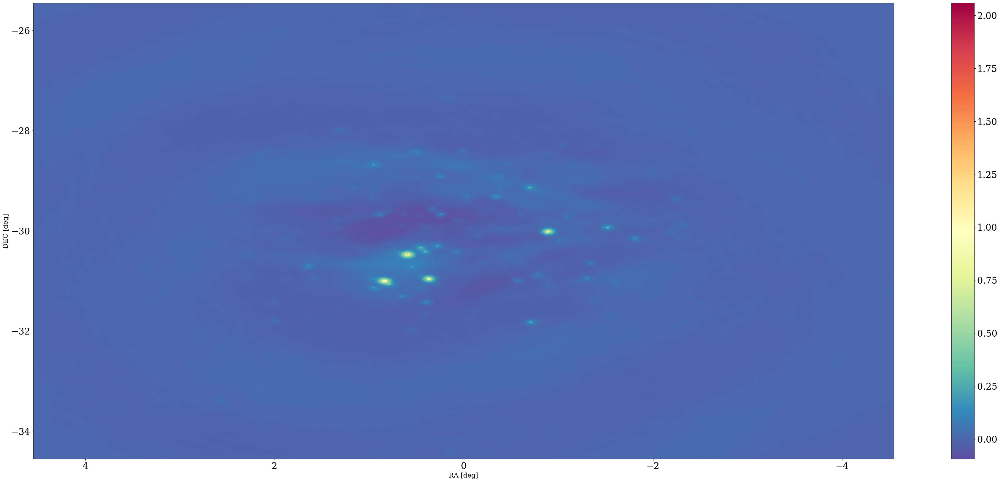

In [11]:
ext=(RA[0],RA[-1], DEC[0], DEC[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',extent=ext,
                      cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=300)
im = plt.imshow(image[nu_id,:,:],**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'Central 3deg, Freq = {freq[nu_id]/1e6} MHz',fontsize=20)
plt.colorbar(orientation='vertical',pad=0.02,label='[JY]')
plt.savefig("/scratch/anshuman/Eeshan/RRI_Figures/raw_image.png")


(150, 456976)


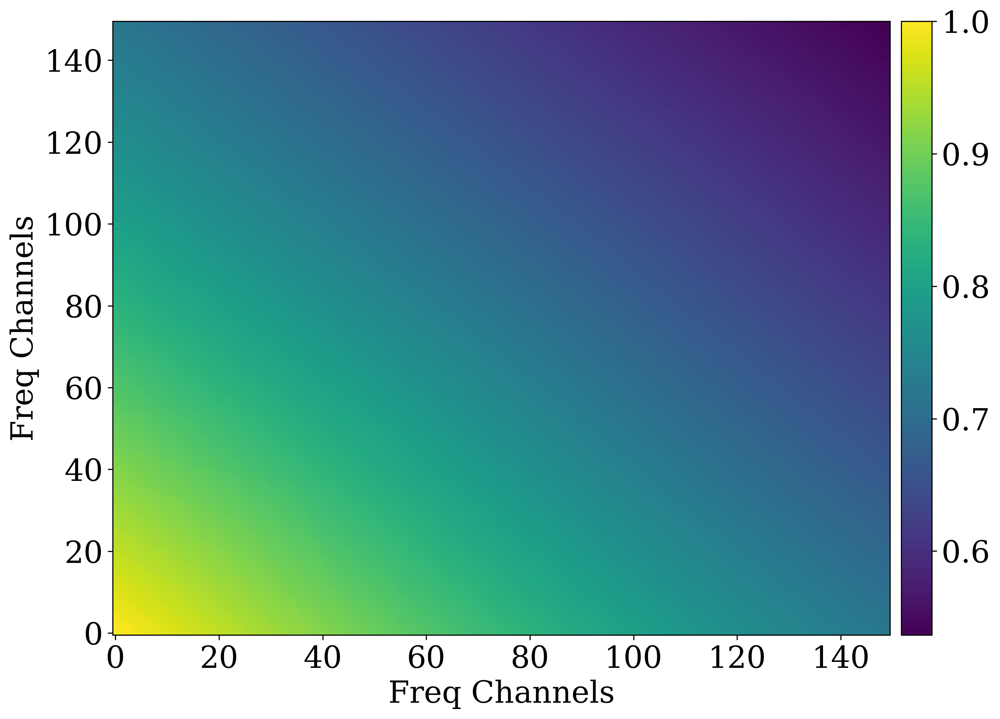

In [52]:
Im = image.reshape(nfreq,image.shape[1]**2)
print(Im.shape)
even_data_cov = np.cov(Im)

fig = plt.figure(figsize=(12,8),dpi=300)
plt.imshow(even_data_cov/even_data_cov.max(), origin='lower', aspect='auto')
plt.colorbar(pad=0.012)
# plt.title('Freq-Freq Cov Even data')
plt.xlabel('Freq Channels')
plt.ylabel('Freq Channels')
plt.savefig("/scratch/anshuman/Eeshan/RRI_Figures/Freq-Freq_Cov_raw_data.png")

In [12]:
# Train+Test Segregation

In [13]:
# #Normalising images
# for i in range(len(image)):
#     image[i,:,:] = (image[i,:,:]-np.mean(image[i,:,:]))/(np.max(image[i,:,:])-np.min(image[i,:,:]))

In [14]:
# #Normalising images
# for i in range(len(image_1)):
#     image_1[i,:,:] = (image_1[i,:,:]-np.mean(image_1[i,:,:]))/(np.max(image_1[i,:,:])-np.min(image_1[i,:,:]))

In [46]:
from numpy.random import default_rng
rng = default_rng()

# patch_indices = rng.choice(Nx//npix_dim, size=Nx//npix_dim, replace=False) # Randomize patches
# numbers = np.arange(0,Nx//npix_dim)   # Seq Patches
freq_slice = 64
npix_dim=64

freq_batch = rng.choice(150, freq_slice, replace=False)  # 150/nfreq
# numbers = np.arange(0,nfreq)
# freq_batch = []
# # print(numbers)
# for i in range(0,freq_slice):
#     freq_batch.append(numbers[i]*3)


sky_patch_batch = rng.choice(nx//npix_dim, nx//npix_dim, replace=False)


In [47]:
print(freq_batch)
# print(val_batch)
# print(test_batch)
print(sky_patch_batch)

[ 84   2  59  15  35 114 103  62  96  13  44  56  80 136  61 145  53  89
  48 129  14  74 115  50   8   7 117 116  66  28  85 105  81  16 139  76
  91  67  63  18 121 149  29  94  68 123  40  49   5 122  26  32   4 130
  25  86 131  90 101 126  88  77  17  99]
[7 8 1 2 4 6 9 5 3 0]


In [48]:
train_patch=sky_patch_batch[:int(0.8*len(sky_patch_batch))]
val_patch=sky_patch_batch[int(0.8*len(sky_patch_batch)):int(0.9*len(sky_patch_batch))]
test_patch=sky_patch_batch[int(0.9*len(sky_patch_batch)):int(len(sky_patch_batch))]

In [49]:

# arr_150 = np.empty((1,n_dim,n_dim))
arr_150 = np.empty((1,npix_dim,npix_dim))
arr_0 = np.empty((1,freq_slice,npix_dim,npix_dim))
# print('image shape',image.shape)
for i in train_patch:
    for j in freq_batch:
        arr1 = pca_residual_image[ j,npix_dim*i:npix_dim*(i+1),npix_dim*i:npix_dim*(i+1) ]
        # print('arr1 shape',arr1.shape)
        arr_150 = np.concatenate((arr_150,arr1.reshape(1,npix_dim,npix_dim)))
        # print('arr_150 shape',arr_150.shape)
    arr_150=arr_150[1:]
    arr_0 = np.concatenate((arr_0,arr_150.reshape(1,freq_slice,npix_dim,npix_dim)))
    arr_150 = np.empty((1,npix_dim,npix_dim))

    
arr_train = arr_0[1:]
print('arr_train shape',arr_train.shape)


arr_train shape (8, 64, 64, 64)


In [50]:

# arr_150 = np.empty((1,n_dim,n_dim))
arr_150 = np.empty((1,npix_dim,npix_dim))
arr_0 = np.empty((1,freq_slice,npix_dim,npix_dim))
# print('image shape',image.shape)
for i in val_patch:
    for j in freq_batch:
        arr1 = pca_residual_image[ j,npix_dim*i:npix_dim*(i+1),npix_dim*i:npix_dim*(i+1) ]
        # print('arr1 shape',arr1.shape)
        arr_150 = np.concatenate((arr_150,arr1.reshape(1,npix_dim,npix_dim)))
        # print('arr_150 shape',arr_150.shape)
    arr_150=arr_150[1:]
    arr_0 = np.concatenate((arr_0,arr_150.reshape(1,freq_slice,npix_dim,npix_dim) ))
    arr_150 = np.empty((1,npix_dim,npix_dim))

arr_val = arr_0[1:]
print('arr_val shape',arr_val.shape)    

arr_val shape (1, 64, 64, 64)


In [51]:

# arr_150 = np.empty((1,n_dim,n_dim))
arr_150 = np.empty((1,npix_dim,npix_dim))
arr_0 = np.empty((1,freq_slice,npix_dim,npix_dim))
# print('image shape',image.shape)
for i in test_patch:
    for j in freq_batch:
        arr1 = pca_residual_image[ j,npix_dim*i:npix_dim*(i+1),npix_dim*i:npix_dim*(i+1) ]
        # print('arr1 shape',arr1.shape)
        arr_150 = np.concatenate((arr_150,arr1.reshape(1,npix_dim,npix_dim)))
        # print('arr_150 shape',arr_150.shape)
    arr_150=arr_150[1:]
    arr_0 = np.concatenate((arr_0,arr_150.reshape(1,freq_slice,npix_dim,npix_dim)))
    arr_150 = np.empty((1,npix_dim,npix_dim))

    
arr_test = arr_0[1:]
print('arr_test shape',arr_test.shape)

arr_test shape (1, 64, 64, 64)


Loading Test Data

In [52]:

# arr_150 = np.empty((1,n_dim,n_dim))
arr_150 = np.empty((1,npix_dim,npix_dim))
arr_0 = np.empty((1,freq_slice,npix_dim,npix_dim))
# print('image shape',image.shape)
for i in train_patch:
    for j in freq_batch:
        arr1 = image_1[ j,npix_dim*i:npix_dim*(i+1),npix_dim*i:npix_dim*(i+1) ]
        # print('arr1 shape',arr1.shape)
        arr_150 = np.concatenate((arr_150,arr1.reshape(1,npix_dim,npix_dim)))
        # print('arr_150 shape',arr_150.shape)
    arr_150=arr_150[1:]
    arr_0 = np.concatenate((arr_0,arr_150.reshape(1,freq_slice,npix_dim,npix_dim)))
    arr_150 = np.empty((1,npix_dim,npix_dim))

    
arr_true_train = arr_0[1:]
print('arr_true_train shape',arr_true_train.shape)

arr_true_train shape (8, 64, 64, 64)


In [53]:

# arr_150 = np.empty((1,n_dim,n_dim))
arr_150 = np.empty((1,npix_dim,npix_dim))
arr_0 = np.empty((1,freq_slice,npix_dim,npix_dim))
# print('image shape',image.shape)
for i in val_patch:
    for j in freq_batch:
        arr1 = image_1[ j,npix_dim*i:npix_dim*(i+1),npix_dim*i:npix_dim*(i+1) ]
        # print('arr1 shape',arr1.shape)
        arr_150 = np.concatenate((arr_150,arr1.reshape(1,npix_dim,npix_dim)))
        # print('arr_150 shape',arr_150.shape)
    arr_150=arr_150[1:]
    arr_0 = np.concatenate((arr_0,arr_150.reshape(1,freq_slice,npix_dim,npix_dim)))
    arr_150 = np.empty((1,npix_dim,npix_dim))

    
arr_true_val = arr_0[1:]
print('arr_true_val shape',arr_true_val.shape)

arr_true_val shape (1, 64, 64, 64)


In [54]:

# arr_150 = np.empty((1,n_dim,n_dim))
arr_150 = np.empty((1,npix_dim,npix_dim))
arr_0 = np.empty((1,freq_slice,npix_dim,npix_dim))
# print('image shape',image.shape)
for i in test_patch:
    for j in freq_batch:
        arr1 = image_1[ j,npix_dim*i:npix_dim*(i+1),npix_dim*i:npix_dim*(i+1) ]
        # print('arr1 shape',arr1.shape)
        arr_150 = np.concatenate((arr_150,arr1.reshape(1,npix_dim,npix_dim)))
        # print('arr_150 shape',arr_150.shape)
    arr_150=arr_150[1:]
    arr_0 = np.concatenate((arr_0,arr_150.reshape(1,freq_slice,npix_dim,npix_dim)))
    arr_150 = np.empty((1,npix_dim,npix_dim))

    
arr_true_test = arr_0[1:]
print('arr_true_test shape',arr_true_test.shape)

arr_true_test shape (1, 64, 64, 64)


In [51]:
# np.save(os.path.join(path,'Test_Data_150x2048x2048/pbcorrected_kelvin_150x2048x2048.npy'),image_1)

# Load the primary beam

In [13]:
hdu_beam = fits.open(os.path.join(path,'Band5_Data/SKA_beam_sub_5_166_180.9_MHz.fits'))[0]
# # hdu = fits.open(os.path.join(path,'Samit_Data/TRecs_g_0.001/SKA_MODEL_SKY_2MIN_30MIN_z_7.305_g_0.001_r_0.5.fits'))[0]
hdr_beam = hdu_beam.header
print(hdr_beam)
image_beam= np.array(hdu_beam.data[:])

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -32 / array data type                                NAXIS   =                    3 / number of array dimensions                     NAXIS1  =                 2560                                                  NAXIS2  =                 2560                                                  NAXIS3  =                  150                                                  CRPIX1  =                 1280                                                  CDELT1  = -0.00444444444444800                                                  CRVAL1  =    0.00000000000E+00  /                                               CTYPE1  = 'RA---SIN'  /                                                         CRPIX2  =                 1280                                                  CDELT2  = 0.004444444444448001                                                  CRVAL2  =   -3.00000000000E+01  /       

In [14]:
nfreq_beam = hdr_beam['NAXIS3']

In [15]:
beam = np.array(hdu_beam.data[:])

In [16]:
beam_shape = hdu_beam.data[:].shape

# Now take the beam of same shape as image
# Note that, the primary beam image is larger than the actual image

In [17]:
im_size_deg = abs(hdr['CDELT1']) * Nx # image size in deg
im_size_deg

9.102222222222213

In [18]:
# Make the beam image same as data image
theta_fov = im_size_deg # deg
res = abs(np.radians(hdr_beam['CDELT1']))
fov = np.radians(theta_fov)
fov_sin = 2 * np.sin(fov / 2.)

In [19]:
n = fov_sin / res
idx = int((int(beam_shape[1]) - n) / 2.)-1
idx

256

In [20]:
# Trimmed central 4deg map
pb_map = beam[:, idx:-idx, idx:-idx]

In [21]:
pb_map.shape

(150, 2048, 2048)

In [22]:
# ext=(RA[0],RA[-1], DEC[0], DEC[-1])
# imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',
#                     extent=ext,  cmap='Spectral_r')

# plt.figure(figsize=(12,8),dpi=100)
# nu_id = 0
# im = plt.imshow(pb_map[nu_id,:,:],**imshow_kwargs,vmin=0,vmax=1)
# plt.xlabel("RA [deg]",fontsize=16)
# plt.ylabel('DEC [deg]',fontsize=16)
# plt.title(f'beam; Freq = {freq[nu_id]/1e6}',fontsize=24)
# plt.colorbar(orientation='vertical',pad=0.02)

In [23]:
# Do the PB correction by dividing the beam
# data_pb = np.divide(image,pb_map)
image = np.divide(image,pb_map)

In [24]:
# Do the PB correction to test data by dividing the beam
# data_pb1 = np.divide(image_1[:-1,:,:],pb_map)


In [25]:
# np.save('data_pb.npy',data_pb)
# np.save('data_pb1.npy',data_pb1)
# np.save('data_filt_pb.npy',data_filt_pb)


In [26]:
# Take the central 2 deg of the pb_corrected image
theta_fov = 3.0 # deg
res = abs(np.radians(hdr['CDELT1']))
fov = np.radians(theta_fov)
fov_sin = 2 * np.sin(fov / 2.)
n = fov_sin / res
idx = int((Nx - n) / 2.)

# cart_map = data_pb[:, idx:-idx, idx:-idx]
image = image[:, idx:-idx, idx:-idx]
image_1 = image_1[:, idx:-idx, idx:-idx]


In [27]:
ra = RA[idx:-idx]
dec = DEC[idx:-idx]

NameError: name 'freq' is not defined

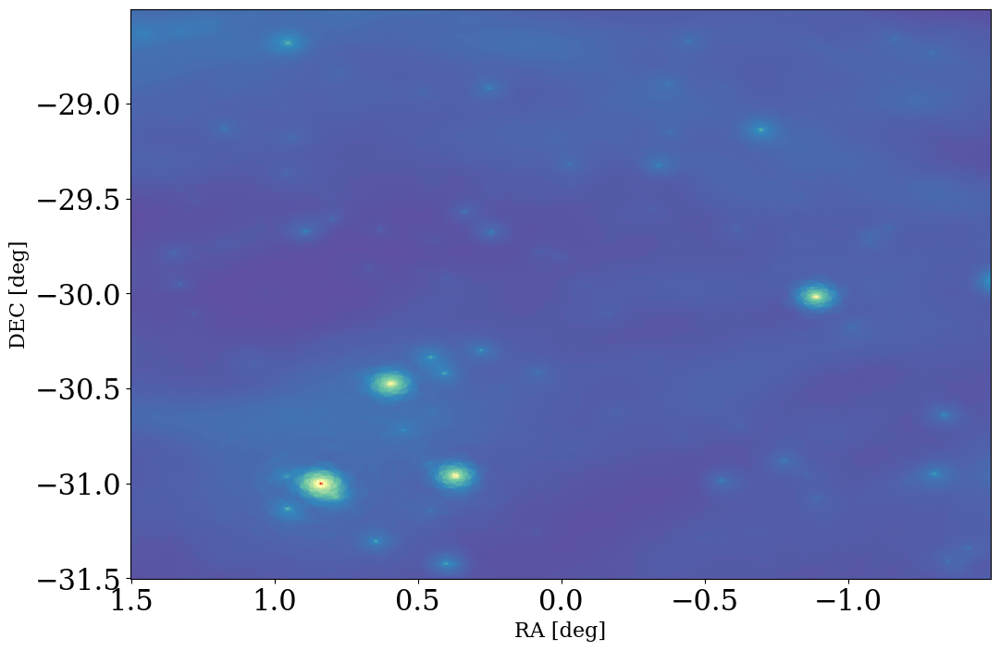

In [28]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',extent=ext,
                      cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(image[nu_id,:,:],**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'Central 2deg FG filt image in k; Freq = {freq[nu_id]/1e6}',fontsize=20)
plt.colorbar(orientation='vertical',pad=0.02)

# Jy/beam to kelvin conversion

In [29]:
# Freq array of the data
freq0 = hdr.get('CRVAL3') # First freq channel value in Hz
chan_res = hdr.get('CDELT3') # chan res in Hz
freq = freq0 + chan_res * (np.arange(nfreq)) # The freq array in Hz
print(f"freq range : {freq[0]/1e6} to {freq[-1]/1e6} MHz")
print(f" Chan res : {chan_res/1e6} MHz")

freq range : 166.0 to 180.9 MHz
 Chan res : 0.1 MHz


In [30]:
len(freq)

150

In [31]:
# Central freq and redshift
nu_c = freq[int(freq.size/2.0)]/1e6 # in MHz
print(f'The central freq is {nu_c} MHz')

wl = c/(nu_c*1e6) # nu_c is the freq of the map in MHz
print(f'The wavelength :  {wl} m')

redshift = f21.value/nu_c - 1
print('Redshift = ',redshift)

bl_max = 1500. # Max baseline in m
PSF = wl/bl_max 
PSF_arcsec = np.degrees(PSF) * 3600 # in arcsec
print(f'The PSF size : {PSF_arcsec} arcsec')

omega_psf = (np.pi * PSF_arcsec**2)/((4*np.log(2)))# 
omega_psf_sr = (omega_psf*un.arcsec**2).to('sr')
print(f'PSF area ={omega_psf_sr}')
# Bmaj=Bmin= PSF_arcsec
# beam_area = (pi * Bmaj * Bmin)/(4 * log(2))

# Check using BMAJ and BMIN
bmaj = hdr['BMAJ']
bmin = hdr['BMIN']
omega = np.radians(bmaj) * np.radians(bmin) * np.pi / (4 * np.log(2))

jybeam2k_factor = jy_per_beam_to_kelvin(freq/1e6,omega)
print(f'The mean conversion factor from Jy/bm to K at this freq is {np.mean(jybeam2k_factor)}')

The central freq is 173.5 MHz
The wavelength :  1.7279104207492795 m
Redshift =  7.186776668587896
The PSF size : 237.60473876545925 arcsec
PSF area =1.5035724163725403e-06 sr
The mean conversion factor from Jy/bm to K at this freq is 1378.5561681255726


In [32]:
image = image* jybeam2k_factor[:,None,None]
image_1 = image_1* jybeam2k_factor[:,None,None]

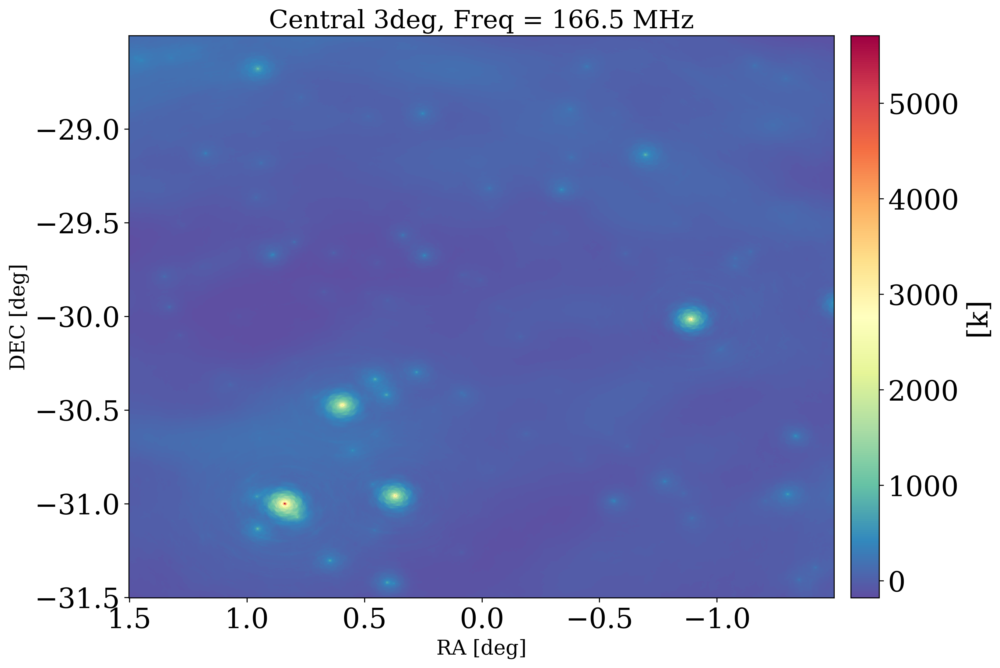

In [37]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',extent=ext,
                      cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=300)
im = plt.imshow(image[nu_id,:,:],**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'Central 3deg, Freq = {freq[nu_id]/1e6} MHz',fontsize=20)
plt.colorbar(orientation='vertical',pad=0.02,label='[k]')
plt.savefig("/scratch/anshuman/Eeshan/RRI_Figures/pbcor_kelvin_image.png")

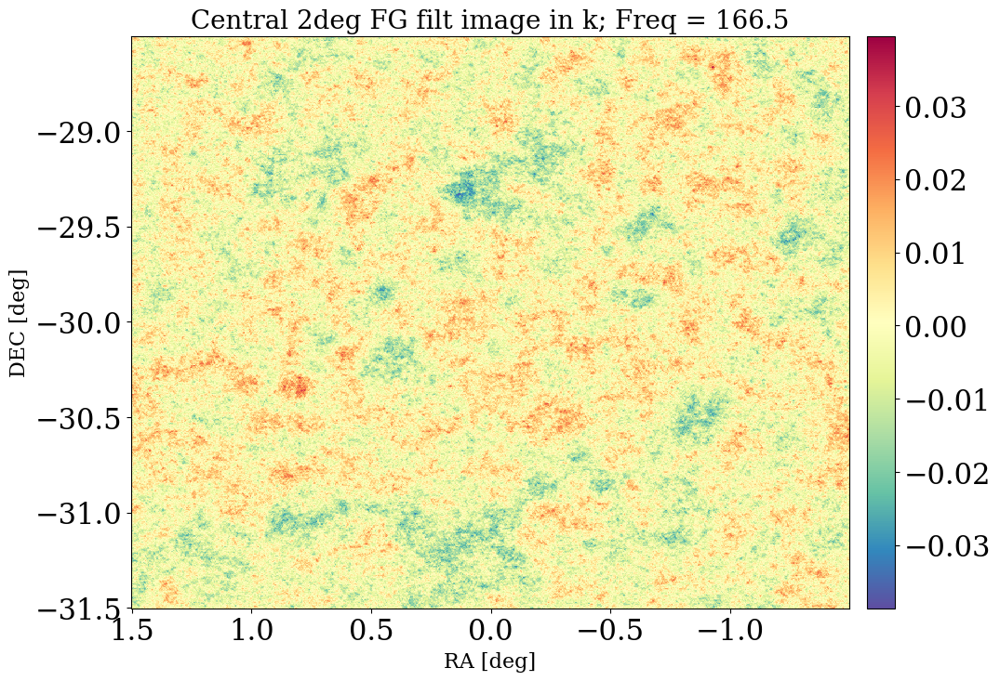

In [34]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',extent=ext,
                     cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(image_1[nu_id,:,:],**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'Central 2deg FG filt image in k; Freq = {freq[nu_id]/1e6}',fontsize=20)
plt.colorbar(orientation='vertical',pad=0.02)

In [35]:
from sklearn.decomposition import PCA

In [36]:
nfreq,nx,ny=image.shape

In [37]:
mean_sub_kelvin_pbcor = np.empty(image.shape)
for i in range(len(image)):
    mean_sub_kelvin_pbcor[i] = (image[i]- np.mean(image))/np.std(image)

In [38]:
#PCA Parameters
nfg = 3
svd_solver = 'full'

In [39]:
pca = PCA(n_components=nfg,svd_solver=svd_solver)

In [40]:
components=pca.fit_transform(mean_sub_kelvin_pbcor.reshape((nfreq,nx**2)))

In [41]:
projected = pca.inverse_transform(components)

In [42]:
pca_residual_image = (np.subtract(mean_sub_kelvin_pbcor.reshape((nfreq,nx**2)),projected)).reshape((nfreq,nx,nx))

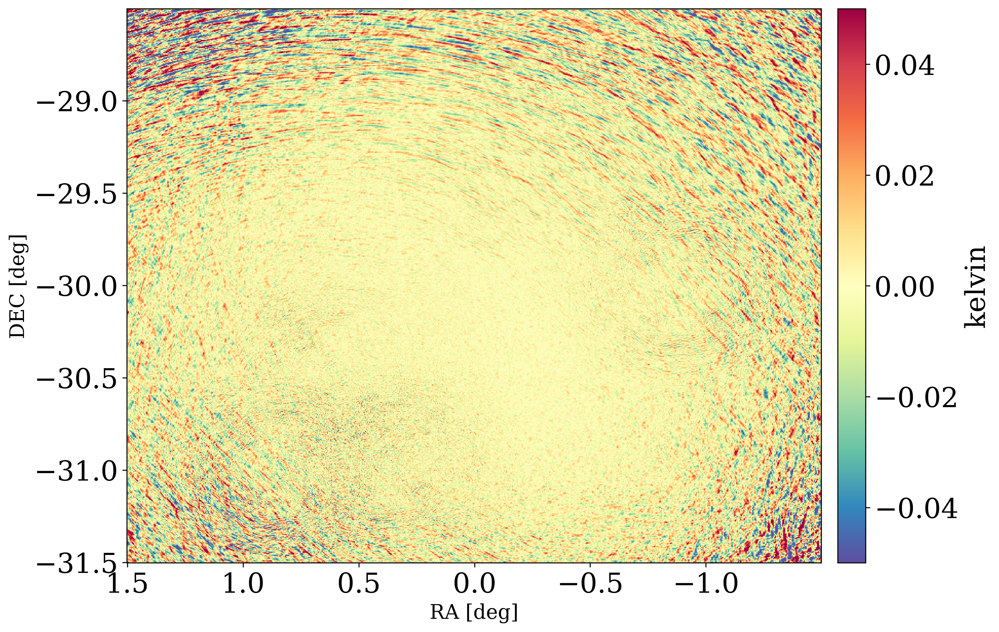

In [43]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',extent=ext,
                      cmap='Spectral_r',vmin=-0.05,vmax=0.05)

nu_id = 10

plt.figure(figsize=(12,8),dpi=300)
im = plt.imshow(pca_residual_image[nu_id,:,:],**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
# plt.title(rf'Central 3$\degree$ PCA-3 filtered; Freq = {freq[nu_id]/1e6}',fontsize=20)
plt.colorbar(orientation='vertical',pad=0.02,label='kelvin')
plt.savefig("/scratch/anshuman/Eeshan/RRI_Figures/Central3deg_PCA3_167MHz.png")

In [44]:
# image_1_norm = np.array(image_1.shape)
# for i in range(len(image_1)):
#     image_1_norm[i] = (image_1[i]- np.mean(image_1))/np.std(image_1)

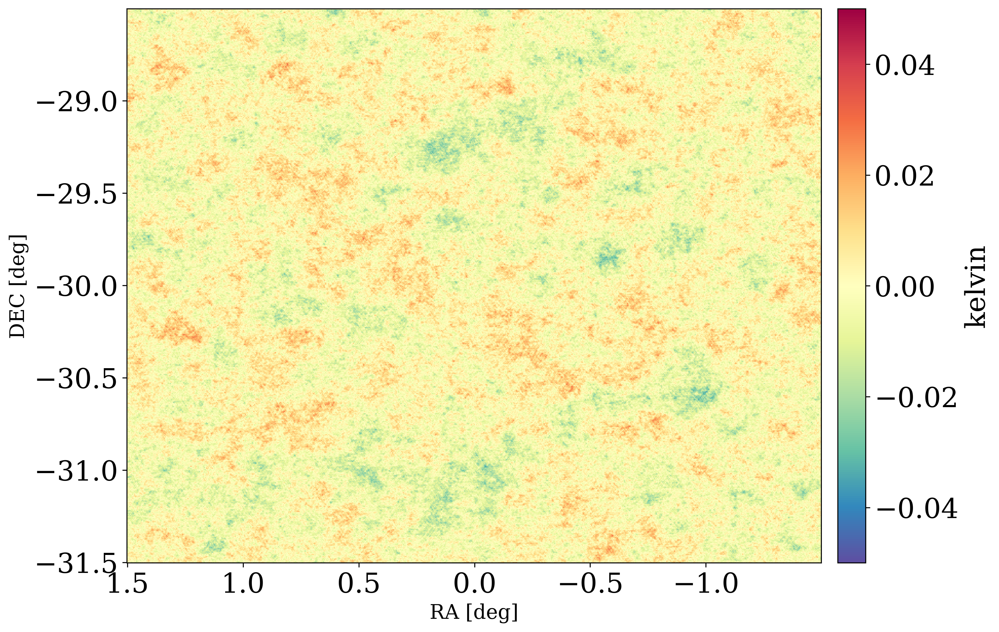

In [45]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',extent=ext,
                     cmap='Spectral_r',vmax=0.05,vmin=-0.05)

nu_id = 10

plt.figure(figsize=(12,8),dpi=300)
im = plt.imshow(image_1[nu_id,:,:],**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
# plt.title(f'True HI+Noise; Freq = {freq[nu_id]/1e6}',fontsize=20)
plt.colorbar(orientation='vertical',pad=0.02,label='kelvin')
plt.savefig("/scratch/anshuman/Eeshan/RRI_Figures/Central3deg_HIplusNoise_167MHz.png")

# Spatial Fourier Transform

In [ ]:
apply_spatial_taper = True

In [ ]:
# Transform to vis domain -- data
# data_uv_nu = image_to_uv(cart_map_kelvin, window=False,axes=(1,2))
data_filt_uv_nu = image_to_uv(cart_map_filt_kelvin, window=True,axes=(1,2))
data_test_filt_uv_nu = image_to_uv(cart_map_test_kelvin, window=True,axes=(1,2))


In [ ]:
data_test_filt_uv_nu.shape

# Delay Transform

In [ ]:
import scipy.signal.windows as windows

In [ ]:
apply_spectral_window = True
window_name = 'nuttall'
nfreq= freq.size

In [ ]:
if apply_spectral_window:

    # Generate a blackmanharris window to apodisation
    window = windows.get_window(window_name,nfreq)
    w = window[:,np.newaxis,np.newaxis]

    # data_uv_tau =  np.fft.fftshift(np.fft.ifft(data_uv_nu * w,axis=0),axes=0)
    data_filt_uv_tau =  np.fft.fftshift(np.fft.ifft(data_filt_uv_nu * w,axis=0),axes=0)
else:
    # data_uv_tau =  np.fft.fftshift(np.fft.ifft(data_uv_nu,axis=0),axes=0)
    data_filt_uv_tau =  np.fft.fftshift(np.fft.ifft(data_filt_uv_nu,axis=0),axes=0)


In [ ]:
data_filt_uv_tau.shape

In [ ]:
delays = np.fft.fftshift(np.fft.fftfreq(nfreq, d= chan_res)) # * un.s # in s
tau = delays * 1e6 # in mu-s

In [ ]:
# Estimating the k-modes ##
theta_res = np.deg2rad(abs(dx)) # pixel res (deg->rad), taking the mean resolution


In [ ]:
print(theta_res,res)

In [ ]:
# # New shape of the trimmed 2deg image
# nx = data_uv_tau.shape[1]
# ny = data_uv_tau.shape[2]

In [ ]:
# New shape of the trimmed 2deg image
nx = data_filt_uv_tau.shape[1]
ny = data_filt_uv_tau.shape[2]

In [ ]:
# get the Fourier modes
kx, ky, u, v = get_spatial_kmodes(nx,ny,theta_res,redshift)
k_perp = np.sqrt(kx[:,np.newaxis]**2 + ky[np.newaxis,:] **2)  # [Mpc^-1]

In [ ]:
(wl * kperp_to_u(k_perp.max() * un.Mpc**-1,redshift))/1e3

In [ ]:
k_parallel = delay_to_kpara(delays * un.s,redshift,cosmo=cosmo)

In [ ]:
plt.figure(figsize=(12,8),dpi=100)
# plt.plot(k_parallel.value, abs(data_uv_tau[:,100,100].real),color='red',label='Data')
plt.plot(k_parallel.value, abs(data_filt_uv_tau[:,100,100].real),color='black',linestyle='--',label='FG filt')

plt.axvline(0.2,lw=2,color='green')
plt.axvline(0.6,lw=2,color='green')
plt.yscale('log')
plt.xlabel(r'k_par [Mpc^-1]')
plt.ylabel(r'Data [K]')
plt.legend()
# plt.axvline(0.2)
#plt.xlim(-2,2)

In [ ]:
dfreq = chan_res/1e6 # chan res in MHz
f21.value

In [ ]:
# The volume normalization
vol_norm = vol_normalization_vis(Nx = nx, Ny = ny, Nz = nfreq,
                                      theta_res = theta_res, redshift=redshift,chan_width = dfreq)

In [ ]:
# Take the 3D correlation, (auto-ps), and normalize by the volume of the survey. We take the real part only.
# data_corr_real = get_ps(data_uv_tau,vis_cube_2=data_uv_tau,vol_norm_factor=(vol_norm))
data_filt_corr_real = get_ps(data_filt_uv_tau,vis_cube_2=data_filt_uv_tau,vol_norm_factor=(vol_norm))

In [ ]:
data_filt_corr_real.shape

In [ ]:
tau_id = np.argmin(abs(tau-0.))

In [ ]:
# delay_id = tau_id

# fig = plt.figure(figsize=(16, 12), dpi=100)

# im = plt.imshow(np.log10(data_corr_real[delay_id,:,:]),
#                    extent=(kx[0],kx[-1], ky[0], ky[-1]),
#                 aspect='auto', origin='lower', interpolation='nearest',cmap='magma')
# plt.colorbar(im, extend='both',pad=0.1, orientation='horizontal',label='PS')
# plt.xlabel(r'kx',fontsize=14)
# plt.ylabel(r'ky',fontsize=14)
# plt.title(f'Data : tau = {np.round(tau[delay_id],2)} micro-sec',fontsize=14)
# # plt.ylim(-2,2)
# # plt.xlim(-2,2)
# plt.tight_layout()
# plt.show()

In [ ]:
delay_id = tau_id

fig = plt.figure(figsize=(16, 12), dpi=100)

im = plt.imshow(np.log10(data_filt_corr_real[delay_id,:,:]),
                   extent=(kx[0],kx[-1], ky[0], ky[-1]),
                aspect='auto', origin='lower', interpolation='nearest',cmap='magma')
plt.colorbar(im, extend='both',pad=0.1, orientation='horizontal',label='PS')
plt.xlabel(r'kx',fontsize=14)
plt.ylabel(r'ky',fontsize=14)
plt.title(f'Data filt: tau = {np.round(tau[delay_id],2)} micro-sec',fontsize=14)
# plt.ylim(-2,2)
# plt.xlim(-2,2)
plt.tight_layout()
plt.show()

In [ ]:
# SKA baselines choice for Power spectrum estimation
u_min = 40.0 #m
u_max = 1500.0 #m
u_min_lambda = u_min/wl; u_max_lambda = u_max/wl
kperp_min = u_to_kperp(u_min_lambda,redshift,cosmo=cosmo)
kperp_max = u_to_kperp(u_max_lambda,redshift,cosmo=cosmo)

print(f'Min baseline: {u_min} m, Max baseline: {u_max} m,z: {redshift}, Wavelength:{wl} m')
print(f'Min bl in wavelength unit: {u_min_lambda},Max bl: {u_max_lambda}')
print(f'Min kperp: {kperp_min}, Max kperp: {kperp_max}')

In [ ]:
# keep the non-zero visibilities between minimum and maximum baseline for each delay channel
# also, take the flatten array; i.e, the out put is (ntau,nvis),
# where nvis is number of vis between two limit

# data_corr, uu, vv,  = reshape_data_cube(data_corr_real,u,v,u_min_lambda, u_max_lambda)
data_filt_corr, uu, vv,  = reshape_data_cube(data_filt_corr_real,u,v,u_min_lambda, u_max_lambda)

In [ ]:
data_filt_corr.shape

In [ ]:
# The true kperp and kpar bins
kperp_bins = np.loadtxt(os.path.join("/content/drive/MyDrive/Skao_Image_Data/Test_Data_166_181","bins_kper.txt"))
kpar_bins = np.loadtxt(os.path.join("/content/drive/MyDrive/Skao_Image_Data/Test_Data_166_181","bins_kpar.txt"))

In [ ]:
kperp_bins.min(),kperp_bins.max()

# 2D PS for the data

In [ ]:
kperp,kl,ps_2D,ps_2D_w,ps_2D_err  = PS2D(data_corr,weight_cube=None,kperp_bins=kperp_bins,
                                    kpar_bins=kpar_bins,
                                    kpar=k_parallel.value, uu = uu, vv = vv,redshift=redshift,
                                    )

In [ ]:
# With no binning along k_par
k_perp,k_par,ps_2D_no_kpar,_,_ = PS2D_no_kpar_bin(data_corr,weight_cube=None,
                    kperp_min=kperp_min.value,kperp_max=kperp_max.value,kpar=k_parallel.value,
                    uu=uu,vv=vv,redshift=redshift,fold=True,
                    Nbins_2D=50,log_bins=False)

# 2D PS for the PCA cleaned cube

In [ ]:
kperp,kl,ps_filt_2D,ps_filt_2D_w,ps_filt_2D_err  = PS2D(data_filt_corr,weight_cube=None,kperp_bins=kperp_bins,
                                    kpar_bins=kpar_bins,
                                    kpar=k_parallel.value, uu = uu, vv = vv,redshift=redshift,
                                    )

In [ ]:
k_perp,k_par,ps_filt_2D_no_kpar,_,_ = PS2D_no_kpar_bin(data_filt_corr,weight_cube=None,
                    kperp_min=kperp_min.value,kperp_max=kperp_max.value,kpar=k_parallel.value,
                    uu=uu,vv=vv,redshift=redshift,fold=True,
                    Nbins_2D=50,log_bins=False)

In [ ]:
kbins = np.sqrt(kl[np.newaxis,:]**2+kperp[:,np.newaxis]**2)
kbins.shape

In [ ]:
# fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

# im = ax.pcolormesh(kperp, kpar_bins, np.log10((ps_2D*1e6)),cmap = 'Spectral_r')


# cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

# cbar.ax.minorticks_off()

# cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
# #ax.set_xscale('log')
# plt.title('Estimated PS Data, no FG filter')
# ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
# ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
# plt.tight_layout()
# plt.show()

In [ ]:
# fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

# im = ax.pcolormesh(k_perp, k_par, np.log10((ps_2D_no_kpar*1e6)),vmin=3,vmax=15,cmap = 'Spectral_r')


# cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

# cbar.ax.minorticks_off()

# cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
# ax.set_xscale('log')
# ax.set_yscale('log')
# plt.title('Estimated PS, no FG filter, no kpar bin')
# ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
# ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
# plt.tight_layout()
# plt.show()

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_2D*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')


cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
#ax.set_xscale('log')
plt.title('Estimated PS, PCA cleaned cube')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.tight_layout()
plt.show()

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(k_perp, k_par, np.log10((ps_filt_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')


cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()
cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
ax.set_xscale('log')
ax.set_yscale('log')
plt.title('Estimated PS, pca clean, no kpar bin')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.tight_layout()
plt.show()

In [ ]:
def k_to_delay(k, z, unit=un.Mpc):
    '''Convert delay to inverse co-moving distance in h Mpc^-1 '''
    return k * freqency_to_comoving_distance(z, unit=unit) / (2 * np.pi)

def freqency_to_comoving_distance(z, unit=un.Mpc):
    '''Return frequency to co-moving distance conversion factor'''
    return ((const.c * (1 + z) ** 2) / (cosmo.H(z) * f21)).to(unit * un.Hz ** -1).value

def delay_to_k(delay, z, unit=un.Mpc):
    '''Convert delay to inverse co-moving distance in h Mpc^-1 '''
    return 2 * np.pi * delay / freqency_to_comoving_distance(z, unit=unit)


In [ ]:
tau_horizon = k_to_delay(k_perp,redshift)
kpar_horizon_100ns_buffer = delay_to_kpara((tau_horizon+100e-9) * un.s,redshift).value
kpar_horizon = delay_to_kpara(tau_horizon * un.s,redshift).value


In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(k_perp, k_par, np.log10((ps_filt_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')

plt.plot(k_perp,kpar_horizon_100ns_buffer,color='black',lw=2)
plt.plot(k_perp,kpar_horizon,color='black',lw=2,linestyle='--')

cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
ax.set_xscale('log')
ax.set_yscale('log')
plt.title('Estimated PS, PCA clean')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.ylim(k_par.min(),k_par.max())
plt.tight_layout()
plt.show()

In [ ]:
# ## Saving the pse ##
# with h5py.File('/home/arnab92/notebooks/SKAD3/PS2D_166MHz_181MHz_data.h5','w') as hf:
#     PS2D = hf.create_dataset('ps_2D',data=ps2D,shape=ps2D.shape)
#     kperp = hf.create_dataset('k_perp',data=k_perp,shape=k_perp.shape)
#     kpara = hf.create_dataset('k_par',data=k_par,shape=k_par.shape)
#     freq = hf.create_dataset('freq',data=freq_sub,shape=freq_sub.shape)
#     redshit = hf.create_dataset('z',data=redshift)

In [ ]:
# True ps
ps = np.loadtxt(os.path.join("/content/drive/MyDrive/Skao_Image_Data/Test_Data_166_181","TestDatasetTRUTH_166MHz-181MHz.data"))

In [ ]:
# kperp_bins = np.loadtxt(os.path.join(path,"bins_kper.txt"))

In [ ]:
# kpar_bins = np.loadtxt(os.path.join(path,"bins_kpar.txt"))

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),cmap = 'Spectral_r')


cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
#ax.set_xscale('log')
plt.title('True ps')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.gridspec as gridspec

In [ ]:
# fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

# gspec = gridspec.GridSpec(1, 2, wspace=0.05)

# plt.subplot(gspec[0, 0])
# plt.pcolormesh(kperp, kpar_bins, np.log10((ps_2D*1e6)),cmap = 'Spectral_r')
# plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
# plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
# plt.title(f'Estimated PS, no FG filter',fontsize=24)
# plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)


# plt.subplot(gspec[0, 1])
# plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),cmap = 'Spectral_r')
# plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
# plt.yticks([])
# plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
# plt.title(f'True',fontsize=24)


In [ ]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)

plt.subplot(gspec[0, 0])
plt.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_2D*1e6)),vmin=3,vmax=6,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, PCA clean',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)


plt.subplot(gspec[0, 1])
plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),vmin=3,vmax=6,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'True',fontsize=24)


# GPR implementation

In [24]:
# pip install gpy

In [25]:
# !pip install Gpy

In [26]:
from sklearn.decomposition import FastICA, NMF, KernelPCA, PCA
import GPy

In [27]:
# Convert the Image to Kelvin unit
data_kelvin = image * jybeam2k_factor[:,None,None]
Im = data_kelvin.reshape(nfreq,Nx * Ny)
print(Im.shape)
# data_cov = np.cov(Im)

(150, 4194304)


In [ ]:
# fig = plt.figure(figsize=(12,8),dpi=100)
# plt.imshow(data_cov/data_cov.max(), origin='lower', aspect='auto')
# plt.colorbar(pad=0.012)
# plt.title('Freq Cov of the data cube')
# plt.xlabel('Freq')
# plt.ylabel('Freq')

In [ ]:
# data_var = np.var(Im, axis=1)

In [ ]:
# plt.figure(figsize=(8,6))
# plt.scatter(freq, data_var, c='blue', marker='v')
# plt.ylabel('daa variance', fontsize=23)
# plt.xlabel('Frequency [MHz]', fontsize=23)

In [28]:
def gpr_fg_clean(data_cube, freqs, k_fg_sky, k_HI, num_restarts=10,
             nPCA=0, noise_data=None, zero_noise=False, heteroscedastic=False, invert=False, num_processes=1,
             include_HI_kern=True):
    '''
    Runs foreground clean on IM data using GPR.
    ---------
    Arguments
    ---------

    data_cube: data cube to be cleaned, in [Nfreq,Nx,Ny] where Nfreq is the frequency direction

    freqs: array of frequency range of data of shape Nfreq in MHz

    k_fg_sky, k_HI: choice of foreground and 21cm kernels (can be a sum or product of different kernels)

    num_restarts: how many times to optimise the GPR regression model.
        [NOTE: If you already know your best fitting kernels (i.e., you're inputting the already
        optimized k_FG and k_21cm kernels), set num_restarts = 0]

    nPCA: 0 if no pre-PCA is desired, otherwise this number is the N_FG number of components used
        in a pre-PCA clean of the data

    noise_data: input here your noise map in [Nfreq,Nx,Ny] if you have a reasonable estimate from your data,
        otherwise set to None and use GPR to try to fit your noise

    zero_noise: if True, the noise in your GPR model will be set to zero and fixed. Otherwise it will try to
        fit to noise in your data, in either the heteroscedastic or non-heteroscedastic case. Set to zero if
        you want to fit your noise with a separate kernel instead, otherwise you will fit to noise twice.

    heteroscedastic: if True, runs Heteroscedastic regression model (variable noise)
        (Note: you cannot have zero_noise=False and heteroscedastic=True at the same time, set
        heteroscedastic=False instead in this case).

    invert: if True, inverts data in the frequency direction
    num_processes = Number of Processes to use in parallel
    '''
    axes = np.shape(data_cube)

    # if desired, do a pre-PCA with nfg=nPCA removed components
    if nPCA > 0:
        print(f'Doing PCA clean first using {nPCA} FG modes')
        data_cube, _,_,_,_,_ = pca_fg_filter(data_cube, nfg=nPCA)

    # converting [Nfreq,Nx,Ny] -> [Nfreq,Npix]
    Input = data_cube.reshape(axes[0],axes[1]*axes[2])
    if noise_data is not None: noise_data = noise_data.reshape(axes[0],axes[1]*axes[2])

    # invert frequency axis
    if invert==True:
        Input = Input[::-1,:]
        freqs = freqs[::-1]  # inverting the freq axis. CHIME data is in decreasing freq order.
        if noise_data is not None: noise_data = noise_data[::-1,:]

    # build your model, input the freq range, the data, and the kernels
    if include_HI_kern:
        kern = k_fg_sky + k_HI
    else:
        kern = k_fg_sky

    # this heteroscedastic case assumes a Gaussian noise variance that changes with frequency
    if heteroscedastic==True:
        # this case assumes noise is known, sets noise level to your noise_data variances
            # at different frequencies (since heteroscedastic)
        if noise_data is not None:
            model = GPy.models.GPHeteroscedasticRegression(freqs[:, np.newaxis], Input, kern)
            model.het_Gauss.variance.constrain_fixed(noise_data.var(axis=1)[:, None])
        # this case assumes noise is not known, model will fit a variance at each frequency
        else:
            model = GPy.models.GPHeteroscedasticRegression(freqs[:, np.newaxis], Input, kern)
        # note: if you want the case of *no noise*, there's no need to use heteroscedastic,
            # so set heteroscedastic = False and see below

    # this non-heteroscedastic case assumes constant Gaussian noise variance throughout frequency
    else:
        # this case assumes noise is know, sets the noise variance level to the variance
            # from the input noise_data
        if noise_data is not None:
            model = GPy.models.GPRegression(freqs[:, np.newaxis], Input, kern)
            model.Gaussian_noise.constrain_fixed(noise_data.var())
        else:
            # this case assumes there is no noise in your data
            if zero_noise == True:
                model = GPy.models.GPRegression(freqs[:, np.newaxis], Input, kern)
                model['.*Gaussian_noise'] = 0.0
                model['.*noise'].fix()
            # this case assumes there is noise but it is unknown, fits a constant variance
            else:
                model = GPy.models.GPRegression(freqs[:, np.newaxis], Input, kern)

    # optimise model, find best fitting hyperparameters for kernels
    model.optimize_restarts(num_restarts=num_restarts, verbose=True,
                            num_processes=num_processes, parallel=num_processes > 1)

    # extract optimised foreground kernel (depending on how many kernels were considered)
    if k_fg_sky.name == 'sum':
        k_FG_len = len(k_fg_sky.parts)
        print(f'FG kernels length {k_FG_len}')
        k_fg_sky = model.kern.parts[0]
        if k_FG_len > 1:
            for i in range(1, k_FG_len):
                k_fg_sky += model.kern.parts[i]
    else: k_fg_sky = model.kern.parts[0]
    print(f'The foreground kernels are {k_fg_sky}')

    # make prediction of what FGs would look like using this optimised FG kernel
    fg_fit, fg_cov = model.predict(freqs[:, np.newaxis], full_cov=True, kern=k_fg_sky,
        include_likelihood=False)

    # subtract FG fit from data, to obtain HI residuals:
    gpr_res = Input - fg_fit

    # un-revert frequency axis:
    if invert==True:
        gpr_res = gpr_res[::-1,:]
        fg_fit = fg_fit[::-1,:]

    # reshape foreground fit
    fg_fit = np.reshape(fg_fit,(axes[0], axes[1], axes[2]))


    # reshape residuals
    gpr_res = np.reshape(gpr_res,(axes[0], axes[1], axes[2]))


    # create series as output object
    d = {'res': gpr_res, 'fgcov': fg_cov, 'fgfit': fg_fit, 'model': model}
    result = pd.Series(d)

    return result

# Define the GPR kernels

In [29]:
# kernel for the smooth foreground:
kern_fg_sky = GPy.kern.RBF(1)
kern_fg_mix = GPy.kern.Matern52(1)
kern_fg_ex = GPy.kern.Matern32(1)

# kernel for the HI cosmological signal:
kern_21 = GPy.kern.Exponential(1)

In [30]:
# setting priors for the smooth foreground kernel:
kern_fg_sky.variance.constrain_bounded(1e6,1e12)
kern_fg_sky.lengthscale.constrain_bounded(6,10)

kern_fg_mix.variance.constrain_bounded(1e2,1e4)
kern_fg_mix.lengthscale.constrain_bounded(4,8)

kern_fg_ex.variance.constrain_bounded(1e1,1e2)
kern_fg_ex.lengthscale.constrain_bounded(1.5,2)

# setting priors for the HI kernel:
kern_21.variance.constrain_bounded(1e-4,5e-1)
kern_21.lengthscale.constrain_bounded(0.4,1.5)

reconstraining parameters rbf.variance
reconstraining parameters rbf.lengthscale
reconstraining parameters Mat52.variance
reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat32.variance
reconstraining parameters Mat32.lengthscale
reconstraining parameters Exponential.variance
reconstraining parameters Exponential.lengthscale


In [31]:
# Define the FG kernel, I am not taking the fg_ex kernel here. The FG kernel is just defined by overall smooth
# RBF kernel and the FG mix kernel, which caputre small scale freq structure.
# LOFAR used a third FG excess kernel to reduce the excess variance in their data, but that requires a careful
# Choice so that we will not get significant signal loss.

kern_fg = kern_fg_sky + kern_fg_mix

In [32]:
freq_MHz = freq/1e6

In [33]:
# GPR parameteres, all these are defined in the gpr_fg_clean function

num_restarts = 0 # no optimization restart. To optimize it will take long time
NprePCA = 0
zero_noise = False
heteroscedastic = True
invert = False
num_processes = 1

In [34]:
import time
import pandas as pd

In [35]:
# Now run GPR using RBF kernel + mix
# My implementation of GPR

t0 = time.time()
gpr_data_cube = gpr_fg_clean(image, freq_MHz,k_fg_sky= kern_fg,k_HI= kern_21, nPCA=NprePCA,
                          num_restarts=num_restarts,noise_data=None, heteroscedastic=heteroscedastic,
                          zero_noise=zero_noise, invert=invert)
t1 = time.time()
print((t1-t0)/60.)

FG kernels length 2
The foreground kernels are   sum.               |           value  |         constraints         |  priors
  rbf.variance       |  500000500000.0  |  1000000.0,1000000000000.0  |        
  rbf.lengthscale    |             8.0  |          6.0,10.0           |        
  Mat52.variance     |          5050.0  |        100.0,10000.0        |        
  Mat52.lengthscale  |             6.0  |           4.0,8.0           |        
0.9444594065348307


In [36]:
gpr_res_cube = gpr_data_cube.res
fg_cov_cube = gpr_data_cube.fgcov
fg_fit_cube = gpr_data_cube.fgfit
model_cube = gpr_data_cube.model
print(gpr_res_cube.shape)

(150, 2048, 2048)


In [71]:
np.save(os.path.join(path,'GPR_Data/GPR_150x2048x2048'),gpr_res_cube)

In [37]:
model_cube

gp.,value,constraints,priors
sum.rbf.variance,500000500000.0,"1000000.0,1000000000000.0",
sum.rbf.lengthscale,8.0,"6.0,10.0",
sum.Mat52.variance,5050.0,"100.0,10000.0",
sum.Mat52.lengthscale,6.0,"4.0,8.0",
sum.Exponential.variance,0.25005,"0.0001,0.5",
sum.Exponential.lengthscale,1.0,"0.4,1.5",
het_Gauss.variance,"(150, 1)",+ve,


([], [])

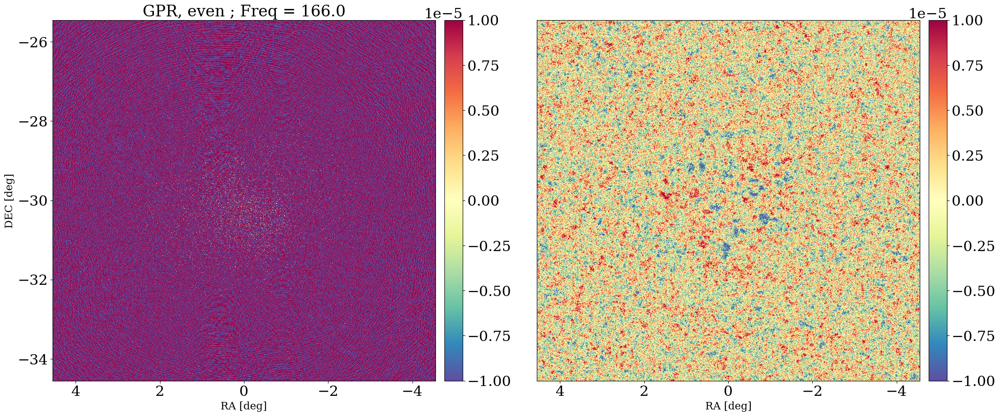

In [70]:
ext=(RA[0],RA[-1], DEC[0], DEC[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',
                     extent=ext,)

nu_id = 0
fig = plt.figure(num=1, figsize=(26, 10), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)

plt.subplot(gspec[0, 0])
plt.imshow(data_filt_pb_gpr[nu_id,:,:],vmin=-1e-5,vmax=1e-5,**imshow_kwargs,cmap='Spectral_r')
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'GPR, even ; Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)


plt.subplot(gspec[0, 1])
plt.imshow(image_1[nu_id,:,:],vmin=-1e-5,vmax=1e-5,**imshow_kwargs,cmap='Spectral_r')
plt.xlabel("RA [deg]",fontsize=16)
# plt.title(f'PCA clean ({Nfg} modes); Freq = {freq[nu_id]/1e6}',fontsize=24)
plt.colorbar(orientation='vertical',pad=0.02)
plt.yticks([])

In [ ]:
# from matplotlib.backends.backend_pdf import PdfPages
# pdf_writer = PdfPages('fg_residual_gpr_2_FG_kernel.pdf')

In [ ]:
# ext=(RA[0],RA[-1], DEC[0], DEC[-1])
# imshow_kwargs = dict(aspect='auto', origin='lower',vmin=-7e-4,vmax=7e-4, interpolation='nearest',
#                      extent=ext, cmap='Spectral_r')

# for ii,jj in enumerate(freq):
#     # print(f'freq : freq{jj}, idx :{ii}')
#     fig, ax = plt.subplots(1, figsize=(12, 8),
#                            dpi=100)

#     gspec = gridspec.GridSpec(1, 1, wspace=0.125)

#     # Map-1 XX
#     plt.subplot(gspec[0, 0])
#     plt.imshow(gpr_res_cube[ii,:,:],**imshow_kwargs)
#     plt.ylabel(r'DEC',fontsize=14)
#     plt.xticks([])
#     plt.title(f'freq = {freq[ii]/1e6}',fontsize=14)
#     plt.tight_layout()
#     pdf_writer.savefig(dpi=100, bbox_inches="tight")
#     plt.close()
#     #plt.show()
# pdf_writer.close()

In [ ]:
fig = plt.figure(figsize=(12,8),dpi=100)
plt.imshow(fg_cov_cube/fg_cov_cube.max(),vmin = -0.4,vmax=0.4, origin='lower', aspect='auto')
plt.colorbar(pad=0.012)
plt.title('Freq Cov of the GPR filt data cube')
plt.xlabel('Freq')
plt.ylabel('Freq')

In [54]:
data_filt_pb_gpr = np.divide(gpr_res_cube,pb_map)

In [59]:
cart_map_filt_gpr = data_filt_pb_gpr[:, idx:-idx, idx:-idx]

In [60]:
data_filt_pb_gpr.shape

(150, 2048, 2048)

In [65]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',
                     extent=ext, cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(cart_map_filt_gpr[nu_id,:,:],vmin=-3e-4,vmax=3e-4,**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
plt.title(f'PB corrected FG filt map, even, central 2deg; Freq = {freq[nu_id]/1e6}',fontsize=16)
plt.colorbar(orientation='vertical',pad=0.02)

NameError: name 'ra' is not defined

In [ ]:
cart_map_filt_gpr_kelvin = cart_map_filt_gpr * jybeam2k_factor[:,None,None]

In [ ]:
data_filt_uv_nu_gpr = image_to_uv(cart_map_filt_gpr_kelvin, window=False,axes=(1,2))

In [ ]:
apply_spectral_window = True
window_name = 'nuttall'
nfreq= freq.size
window = windows.get_window(window_name,nfreq)
w = window[:,np.newaxis,np.newaxis]
data_filt_gpr_uv_tau =  np.fft.fftshift(np.fft.ifft(data_filt_uv_nu_gpr * w,axis=0),axes=0)

In [ ]:
data_filt_gpr_corr_real = get_ps(data_filt_gpr_uv_tau,vis_cube_2=data_filt_gpr_uv_tau,vol_norm_factor=(vol_norm))

In [ ]:
data_filt_gpr_corr, uu, vv,  = reshape_data_cube(data_filt_gpr_corr_real,u,v,u_min_lambda, u_max_lambda)

In [ ]:
delays = np.fft.fftshift(np.fft.fftfreq(nfreq, d= chan_res)) # * un.s # in s
tau = delays * 1e6 # in mu-s
k_parallel = delay_to_kpara(delays * un.s,redshift,cosmo=cosmo)

In [ ]:
kperp,kl,ps_filt_gpr_2D,_,_  = PS2D(data_filt_gpr_corr,weight_cube=None,kperp_bins=kperp_bins,
                                    kpar_bins=kpar_bins,
                                    kpar=k_parallel.value, uu = uu, vv = vv,redshift=redshift,
                                    )

In [ ]:
k_perp,k_par,ps_filt_gpr_2D_no_kpar,_,_ = PS2D_no_kpar_bin(data_filt_gpr_corr,weight_cube=None,
                    kperp_min=kperp_min.value,kperp_max=kperp_max.value,kpar=k_parallel.value,
                    uu=uu,vv=vv,redshift=redshift,fold=True,
                    Nbins_2D=50,log_bins=False)

In [ ]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)

plt.subplot(gspec[0, 0])
plt.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_gpr_2D*1e6)),vmin=2,vmax=5.5,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, GPR clean',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)


plt.subplot(gspec[0, 1])
plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps_filt_2D*1e6)),vmin=2,vmax=5.5,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, PCA clean',fontsize=24)


In [ ]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)

plt.subplot(gspec[0, 0])
plt.pcolormesh(kperp, kpar_bins, np.log10((ps_filt_gpr_2D*1e6)),vmin=2,vmax=5.5,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, GPR clean',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)


plt.subplot(gspec[0, 1])
plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),vmin=2,vmax=5.5,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'True',fontsize=24)


In [ ]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)

plt.subplot(gspec[0, 0])
plt.pcolormesh(k_perp, k_par, np.log10((ps_filt_gpr_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, GPR clean',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.xscale('log')
plt.yscale('log')

plt.subplot(gspec[0, 1])
plt.pcolormesh(k_perp, k_par, np.log10((ps_filt_2D_no_kpar*1e6)),vmin=1,vmax=6,cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, PCA clean',fontsize=24)

In [ ]:
# !pip install numpy==1.23.5

# 3-d U-Net: Version:2

Changes in Version 2:
1. Dropout (20%) at encoder and decoder blocks
2. Optimizer = Nadam
3. Loss = Log_Cosh
4. Num_Filters = 8
5. Loss Rate = 0.001
6. Downsampling = Conv3d (Strides 2)
7. One less encoder/decoder block

In [25]:


# try:
#     arr_train = (arr_train-np.min(arr_train))/(np.max(arr_train)-np.min(arr_train))
# except ValueError:  #raised if `y` is empty.
#     pass
# try:
#     arr_val = (arr_val-np.min(arr_val))/(np.max(arr_val)-np.min(arr_val))
# except ValueError:  #raised if `y` is empty.
#     pass

# try:
#     arr_test = (arr_test-np.min(arr_test))/(np.max(arr_test)-np.min(arr_test))
# except ValueError:  #raised if `y` is empty.
#     pass



In [26]:
# try:
#     arr_true_train = (arr_true_train-np.min(arr_true_train))/(np.max(arr_true_train)-np.min(arr_true_train))
# except ValueError:  #raised if `y` is empty.
#     pass
# try:
#     arr_true_val = (arr_true_val-np.min(arr_true_val))/(np.max(arr_true_val)-np.min(arr_true_val))
# except ValueError:  #raised if `y` is empty.
#     pass

# try:
#     arr_true_test = (arr_true_test-np.min(arr_true_test))/(np.max(arr_true_test)-np.min(arr_true_test))
# except ValueError:  #raised if `y` is empty.
#     pass

In [27]:
# arr_true_train = np.load(os.path.join(path,'PCA3_Data/75x75x75_rand_freq/arr_true_train_kelvin.npy'))
# arr_true_val = np.load(os.path.join(path,'PCA3_Data/75x75x75_rand_freq/arr_true_val_kelvin.npy'))
# arr_true_test = np.load(os.path.join(path,'PCA3_Data/75x75x75_rand_freq/arr_true_test_kelvin.npy'))


# arr_train = np.load(os.path.join(path,'PCA3_Data/75x75x75_rand_freq/arr_train_kelvin.npy')) 
# arr_val = np.load(os.path.join(path,'PCA3_Data/75x75x75_rand_freq/arr_val_kelvin.npy')) 
# arr_test = np.load(os.path.join(path,'PCA3_Data/75x75x75_rand_freq/arr_test_kelvin.npy')) 

In [ ]:
arr_train_norm = np.array(arr_train.shape)
for i in range(len(arr_train)):
    arr_train_norm[i,:,:] = (arr_train[i,:,:]-np.min(arr_train[i,:,:]))/(np.max(arr_train[i,:,:])-np.min(arr_train[i,:,:]))

In [ ]:
arr_val_norm = np.array(arr_val.shape)
for i in range(len(arr_train)):
    arr_val_norm[i,:,:] = (arr_val[i,:,:]-np.min(arr_val[i,:,:]))/(np.max(arr_val[i,:,:])-np.min(arr_val[i,:,:]))

In [ ]:
arr_test_norm = np.array(arr_test.shape)
for i in range(len(arr_train)):
    arr_test_norm[i,:,:] = (arr_test[i,:,:]-np.min(arr_test[i,:,:]))/(np.max(arr_test[i,:,:])-np.min(arr_test[i,:,:]))

In [ ]:
arr_true_train_norm = np.array(arr_true_train.shape)
for i in range(len(arr_true_train)):
    arr_true_train_norm[i,:,:] = (arr_true_train[i,:,:]-np.min(arr_true_train[i,:,:]))/(np.max(arr_true_train[i,:,:])-np.min(arr_true_train[i,:,:]))

In [ ]:
arr_true_val_norm = np.array(arr_true_val.shape)
for i in range(len(arr_true_val)):
    arr_true_val_norm[i,:,:] = (arr_true_val[i,:,:]-np.min(arr_true_val[i,:,:]))/(np.max(arr_true_val[i,:,:])-np.min(arr_true_val[i,:,:]))

In [ ]:
arr_true_test_norm = np.array(arr_true_test.shape)
for i in range(len(arr_true_test)):
    arr_true_test_norm[i,:,:] = (arr_true_test[i,:,:]-np.min(arr_true_test[i,:,:]))/(np.max(arr_true_test[i,:,:])-np.min(arr_true_test[i,:,:]))

In [55]:
arr_train = np.expand_dims(arr_train,axis=-1)
arr_val = np.expand_dims(arr_val,axis=-1)
arr_test = np.expand_dims(arr_test,axis=-1)

In [56]:
arr_true_train = np.expand_dims(arr_true_train,axis=-1)
arr_true_val = np.expand_dims(arr_true_val,axis=-1)
arr_true_test = np.expand_dims(arr_true_test,axis=-1)

In [57]:
# import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import losses
from keras import optimizers
from keras import metrics



2024-09-26 18:17:56.311152: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-26 18:17:56.392956: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [58]:
arr_true_test.shape

(1, 64, 64, 64, 1)

In [59]:
# arr_test

In [60]:
def input_encoder_block(input_img,num_filters,num_layers1,drop):

  x = layers.Conv3D(num_filters, 3, padding='same')(input_img)
  # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
  x = layers.Activation('relu')(x)
  i=0 
  while i<num_layers1:
      x = layers.Conv3D(num_filters, 3, padding='same')(x)
      # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
      x = layers.Activation('relu')(x)
      i=i+1

  # x = layers.Conv3D(num_filters, 3, padding='same')(x)
  # # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
  # x = layers.Activation('relu')(x)
    
  x = layers.Dropout(drop)(x)




  return x

In [61]:
def output_encoder_block(input_img,skip_features,num_filters,num_layers2):

  x = skip_connection(skip_features,input_img)
    
  x = layers.Conv3D(num_filters, 3, padding='same')(x)
  # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
  x = layers.Activation('relu')(x)
  i=0
  while i<num_layers2:
          
      x = layers.Conv3D(num_filters, 3, padding='same')(x)
      # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
      x = layers.Activation('relu')(x)
      i=i+1


  return x

In [62]:
# Encoder block with skip connections

def encoder_block(input_img,num_filters,num_layers3,drop):

  # x = layers.MaxPooling3D(2, padding='same')(input_img)

  x = layers.Conv3D(num_filters,3,strides=2, padding='same')(input_img)
  # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
  x = layers.Activation('relu')(x)
  i=0 
  while i<num_layers3:
      x = layers.Conv3D(num_filters,3, padding='same')(x)
      # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
      x = layers.Activation('relu')(x)
      i = i+1
      
    
  x = layers.Dropout(drop)(x)

  return x

In [63]:
# CDAE - Decoder with skip connections

def decoder_block(input_img,skip_features,num_filters,num_layers3,drop):

  # skip_connections =  tf.image.resize_with_pad(skip_features,input_img.shape[1],input_img.shape[2])
  # skip_connections =  tf.keras.layers.Cropping2D(cropping=input_img.shape[1])(skip_features)
  # x = keras.layers.Concatenate()([input_img,skip_connections])

  x = skip_connection(skip_features,input_img)
  i=0
  while i<num_layers3:
      x = layers.Conv3D(num_filters,3, padding='same')(x)
      # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
      x = layers.Activation('relu')(x)
      i = i+1

  x = keras.layers.Conv3DTranspose(num_filters,
                              2,strides=2,
                              padding = 'same')(x)
  # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
  x = keras.layers.Activation('relu')(x)

  x = layers.Dropout(drop)(x)


  return x

In [64]:
def bottleneck(input_img,num_filters,num_layers4):

  x = layers.Conv3D(num_filters,3,strides=1, padding='same')(input_img)
  # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
  x = layers.Activation('relu')(x)
  i=0  
  while i<num_layers4:
      x = layers.Conv3D(num_filters,3, padding='same')(x)
      # x = layers.BatchNormalization(axis = 1,trainable = False)(x)
      x = layers.Activation('relu')(x)
      i = i+1

  return x

In [65]:
def skip_connection(layer1,layer2):
  #  layer1 =  tf.keras.layers.Cropping2D(cropping=layer1.shape[1])(layer1)
  #  x = np.arange(np.prod(layer1.shape)).reshape(layer1.shape)
  x1,y1,z1 = layer1.shape[1],layer1.shape[2],layer1.shape[3]
  x2,y2,z2 = layer2.shape[1],layer2.shape[2],layer2.shape[3]

  if (y2>y1):
    layer2=layer2[:,:x1,:y1,:z1]

  elif (y2<y1):
    layer1 = layer1[:,:x2,:y2,:z2]

  else:
        if (x2>x1):
            layer2=layer2[:,:x1,:y1,:z1]


  layer2 = layers.Concatenate()([layer1,layer2])
    
  return layer2

In [66]:
# image_train.shape[1:]

In [67]:
#Unet with skip conncetions and bottleneck

def unet_model(n_filters,conv_width,lr,depth,drop,input_shape = arr_train.shape[1:] ):
    inputs = keras.layers.Input(input_shape)
    # Contracting Path
    encoder_layer_list = []
    x0 = input_encoder_block(inputs,n_filters*1,conv_width,drop)

    for l in range(0,depth):
        
        if l==0:
            x= encoder_block(x0, n_filters*(2**1),conv_width,drop)
        else:   
            x= encoder_block(x, n_filters*(2**(l+1)),conv_width,drop)
            
        encoder_layer_list.append(x)  
        
    encoder_layer_list = encoder_layer_list[::-1]

    # Bottleneck
    x = bottleneck(encoder_layer_list[0],n_filters*(2**(depth+1)),conv_width)

    # Expansive Path
    for l in range(0,depth):
        x = decoder_block(x,encoder_layer_list[l], n_filters*(2**(depth-l)),conv_width,drop)
    
    x = output_encoder_block(x,x0, n_filters*1,conv_width )

    # Output
    outputs = layers.Conv3D(         1,
                                     1,
                                     padding = 'valid',
                                     activation = 'tanh')(x)

    model = keras.Model(inputs = inputs,
                                  outputs = outputs,
                                  name = 'U-Net')

    Nadam = optimizers.Adam(learning_rate=lr)
    model.compile(loss = 'mse',
    optimizer = Nadam, metrics = ['log_cosh'])
    return model

In [68]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard

In [69]:
import tensorboard
tensorboard.__version__

'2.10.1'

In [70]:
from datetime import datetime
from packaging import version

In [71]:
rm -rf ./logs/

In [72]:
#Depth at least =2. conv_width=0

if __name__ == '__main__':
    model = unet_model(n_filters=64,conv_width=1,lr=0.0003,depth=3,input_shape=arr_train.shape[1:],drop=0.15)
    model.summary()

2024-09-26 18:17:57.964884: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-26 18:17:58.114800: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43191 MB memory:  -> device: 0, name: NVIDIA L40S, pci bus id: 0000:0a:00.0, compute capability: 8.9
2024-09-26 18:17:58.115328: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 43191 MB memory:  -> device: 1, name: NVIDIA L40S, pci bus id: 0000:ae:00.0, compute capability: 8.9


Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 64,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 64, 64, 64,   1792        ['input_1[0][0]']                
                                64)                                                               
                                                                                                  
 activation (Activation)        (None, 64, 64, 64,   0           ['conv3d[0][0]']                 
                                64)                                                           

In [73]:
import netron

In [182]:
model = unet_model(n_filters=64,conv_width=1,lr=0.0003,depth=2,input_shape=arr_train.shape[1:],drop=0.05)

In [151]:
# Define the Keras TensorBoard callback.
logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

history = model.fit(arr_train, arr_true_train,
                epochs=1000,
                batch_size=16,
                validation_data=(arr_val,arr_true_val) ,callbacks=[tensorboard_callback])

Epoch 1/1000
1/1 [==============================] - 0s 408ms/step - loss: 1.8950e-05 - log_cosh: 9.4784e-06 - val_loss: 8.9238e-05 - val_log_cosh: 4.4618e-05
Epoch 2/1000
1/1 [==============================] - 0s 382ms/step - loss: 1.9069e-05 - log_cosh: 9.5372e-06 - val_loss: 8.8870e-05 - val_log_cosh: 4.4434e-05
Epoch 3/1000
1/1 [==============================] - 0s 381ms/step - loss: 1.9033e-05 - log_cosh: 9.5199e-06 - val_loss: 8.9687e-05 - val_log_cosh: 4.4843e-05
Epoch 4/1000
1/1 [==============================] - 0s 382ms/step - loss: 1.9003e-05 - log_cosh: 9.5047e-06 - val_loss: 8.7823e-05 - val_log_cosh: 4.3911e-05
Epoch 5/1000
1/1 [==============================] - 0s 381ms/step - loss: 1.8840e-05 - log_cosh: 9.4234e-06 - val_loss: 8.9694e-05 - val_log_cosh: 4.4846e-05
Epoch 6/1000
1/1 [==============================] - 0s 382ms/step - loss: 1.8644e-05 - log_cosh: 9.3254e-06 - val_loss: 8.7849e-05 - val_log_cosh: 4.3924e-05
Epoch 7/1000
1/1 [==============================] - 

In [183]:
model.save(os.path.join(path,'/Unet_Model_Final.keras'))

In [184]:
netron.start(os.path.join(path,'/Unet_Model_Final.keras'))

Serving '/Unet_Model_Final.keras' at http://localhost:15204


('localhost', 15204)

In [154]:
# os.environ#['TENSORBOARD_BINARY'] = '/path/to/envs/tf/bin/tensorboard'

In [155]:
# os.environ['TENSORBOARD_BINARY'] = '/home/anshuman/anaconda3/bin/tensorboard'

In [156]:
# tensorboard --host 127.0.0.1:8888

In [157]:
# %tensorboard --logdir logs

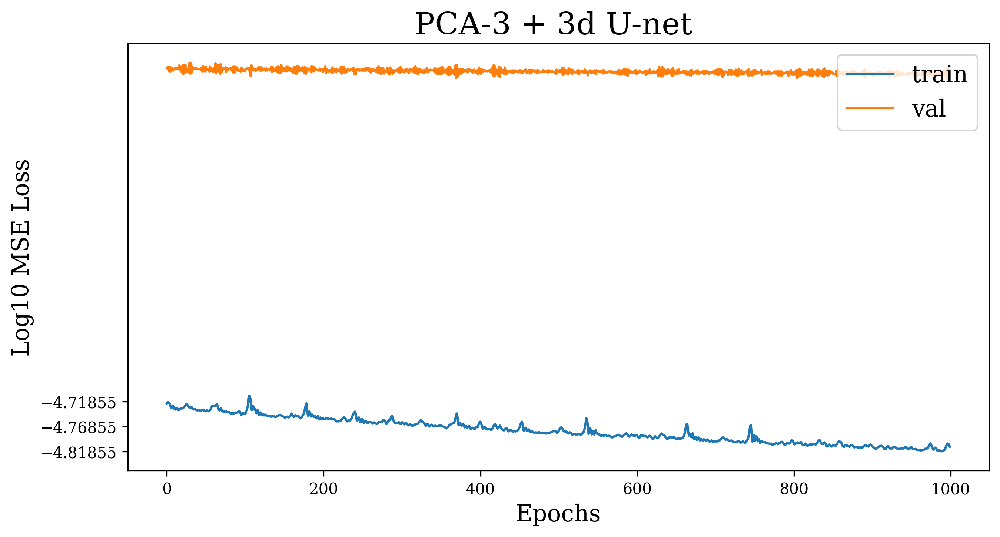

In [158]:
fig = plt.figure(num=1, figsize=(10, 5), dpi=300)
plt.plot(np.log10(history.history['loss']))
plt.plot(np.log10(history.history['val_loss']))
plt.title('PCA-3 + 3d U-net ',size=20)
plt.ylabel('Log10 MSE Loss',size=15)
plt.xlabel('Epochs',size=15)
plt.legend(['train', 'val'], loc='upper right',fontsize=15)
# plt.savefig('LogCosh_3d_Unet1_GPR_50x40x40_epoch500.png', bbox_inches='tight')
plt.xticks(np.arange(0, len(history.history['loss'])+1, 200))
plt.yticks(np.arange( min(np.log10(history.history['loss'])), max(np.log10(history.history['loss'])), 0.05))
plt.yticks(fontsize=10)
plt.xticks(fontsize=10)
plt.savefig("/scratch/anshuman/Eeshan/RRI_Figures/Loss_Graph.png")
plt.savefig("/scratch/anshuman/Eeshan/RRI_Figures/Loss_Graph.pdf")

# plt.xticks(np.arange(min(x), max(x)+1, 1.0))
plt.show()

In [159]:
# model.save(os.path.join(path,'Saved_Models/Unet_Samit_Data_z_7.305.keras'))

In [160]:
decoded_imgs = model.predict(arr_test)

1/1 [==============================] - 0s 25ms/step


In [161]:
decoded_imgs.shape

(1, 64, 64, 64, 1)

In [162]:
decoded_imgs=np.squeeze(decoded_imgs,axis=-1)


In [163]:
# arr_true_test = np.squeeze(arr_true_test)

In [164]:
# decoded_imgs = decoded_imgs.reshape((len(decoded_imgs),614,614))
# decoded_imgs= uv_to_image(decoded_imgs,window=True,window_name ='tukey', alpha=0.5, axes=(1,2))
# f,x,y=np.shape(decoded_imgs)[0],np.shape(decoded_imgs)[1],np.shape(decoded_imgs)[2]

In [188]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
batch_index = 0
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest')
for nu_id in range(0,64):
    
    fig = plt.figure(num=1, figsize=(75, 15), dpi=300)
    fig.suptitle(f'Voxel Prediction for Freq = {freq[freq_batch[nu_id]]/1e6} MHz', fontsize=75)
    gspec = gridspec.GridSpec(1, 3, wspace=0.3)
    
    batch = 0
    decoded = decoded_imgs[batch, nu_id, :, :]
    PCA_data = arr_test[batch, nu_id, :, :]
    true = arr_true_test[batch, nu_id, :, :]
    # Use your data here (pca_data, decoded, true)
    # Subplot 1
    plt.subplot(gspec[0, 0])
    plt.imshow(PCA_data, **imshow_kwargs, cmap='Spectral_r',vmin=-0.02,vmax=0.02)
    plt.xlabel("RA [deg]", fontsize=40)   # Axis label size changed
    plt.ylabel('DEC [deg]', fontsize=40)  # Axis label size changed
    # plt.title('PCA-3',size=60)
    cbar=plt.colorbar(orientation='vertical', fraction=0.2,label='[K]')
    cbar.set_label('[K]', fontsize=40)  # Change colorbar label size
    cbar.ax.tick_params(labelsize=40)  # Change colorbar tick text size
    plt.xticks(fontsize=40)  # Tick label size changed
    plt.yticks(fontsize=40)  # Tick label size changed
    
    # Subplot 2
    plt.subplot(gspec[0, 1])
    plt.imshow(decoded, **imshow_kwargs, cmap='Spectral_r',vmin=-0.02,vmax=0.02)
    plt.xlabel("RA [deg]", fontsize=40)   # Axis label size changed
    plt.ylabel('DEC [deg]', fontsize=40)  # Axis label size changed
    # plt.title('PCA-3 + U-net ',size=60)

    cbar=plt.colorbar(orientation='vertical', fraction=0.2,label='[K]')
    cbar.set_label('[K]', fontsize=40)  # Change colorbar label size
    cbar.ax.tick_params(labelsize=40)  # Change colorbar tick text size
    plt.xticks(fontsize=40)  # Tick label size changed
    plt.yticks(fontsize=40)  # Tick label size changed
    
    # Subplot 3
    plt.subplot(gspec[0, 2])
    plt.imshow(true, **imshow_kwargs, cmap='Spectral_r',vmin=-0.02,vmax=0.02)
    plt.xlabel("RA [deg]", fontsize=40)   # Axis label size changed
    plt.ylabel('DEC [deg]', fontsize=40)  # Axis label size changed
    cbar=plt.colorbar(orientation='vertical', fraction=0.2)
    # plt.title('True HI + Noise',size=60)
    cbar.set_label('[K]', fontsize=40)  # Change colorbar label size
    cbar.ax.tick_params(labelsize=40)  # Change colorbar tick text size
    plt.xticks(fontsize=40)  # Tick label size changed
    plt.yticks(fontsize=40)  # Tick label size changed
    plt.savefig('/scratch/anshuman/Eeshan/RRI_Figures/Voxel_Predict_'+str(nu_id)+'.png')


/tmp/ipykernel_2410336/2453056333.py:16: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(gspec[0, 0])
/tmp/ipykernel_2410336/2453056333.py:28: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(gspec[0, 1])
/tmp/ipykernel_2410336/2453056333.py:41: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(gspec[0, 2])


In [154]:
# data_test = os.path.join(path,'CDAE_sub_5_PCA25_Unet1.fits')
# fits.writeto(data_test, decoded_imgs, hdr_test) #create new image file

# Power SPectrum

In [38]:
def delay_to_kpara(delay, z, cosmo=None):
    """Conver delay in sec unit to k_parallel (comoving 1./Mpc along line of sight).

    Parameters
    ----------
    delay : Astropy Quantity object with units equivalent to time.
        The inteferometric delay observed in units compatible with time.
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to planck2015 year in "little h" units

    Returns
    -------
    kparr : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale parallel to the line of sight probed by the input delay (eta).

    """

    
    if cosmo is None:
        cosmo = default_cosmology.get()
    return (delay * (2 * np.pi * cosmo.H0 * f21 * cosmo.efunc(z))
            / (const.c * (1 + z)**2)).to('1/Mpc')

def kpara_to_delay(kpara, z, cosmo=None):
    """Convert k_parallel (comoving 1/Mpc along line of sight) to delay in sec.

    Parameters
    ----------
    kpara : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale parallel to the line of sight
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to WMAP9 year in "little h" units

    Returns
    -------
    delay : Astropy Quantity units equivalent to time
        The inteferometric delay which probes the spatial scale given by kparr.

    """

    
    if cosmo is None:
        cosmo = default_cosmology.get()
    return (kpara * const.c * (1 + z)**2
            / (2 * np.pi * cosmo.H0 * f21 * cosmo.efunc(z))).to('s')

def kperp_to_u(kperp, z, cosmo=None):
    """Convert comsological k_perpendicular to baseline length u (wavelength unit).

    Parameters
    ----------
    kperp : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale perpendicular to the line of sight.
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to WMAP9 year in "little h" units

    Returns
    -------
    u : float
        The baseline separation of two interferometric antennas in units of
        wavelength which probes the spatial scale given by kperp

    """
    if cosmo is None:
        cosmo = default_cosmology.get()
    return kperp * cosmo.comoving_transverse_distance(z) / (2 * np.pi)

def u_to_kperp(u, z, cosmo=None):
    """Convert baseline length u to k_perpendicular.

    Parameters
    ----------
    u : float
        The baseline separation of two interferometric antennas in units of wavelength
    z : float
        The redshift of the expected 21cm emission.
    cosmo : Astropy Cosmology Object
        The assumed cosmology of the universe.
        Defaults to WMAP9 year in "little h" units

    Returns
    -------
    kperp : Astropy Quantity units equivalent to wavenumber
        The spatial fluctuation scale perpendicular to the line of sight probed by the baseline length u.

    """
    if cosmo is None:
        cosmo = default_cosmology.get()
    return 2 * np.pi * u / cosmo.comoving_transverse_distance(z)

def get_spatial_kmodes(Nx,Ny,theta_res,redshift):
    """Estimate the spatial fourier k-modes, (kx and ky) and the gridded u,v coordinates.  
    
    Parameteres
    -----------
    Nx : int
     Number of cells along RA or X-axis direction.
    Ny : int
      Number of cells along DEC or Y-axis direction.
    theta_res : float 
      The cell size of the map in radian unit.
    redshift : float
      redshift at the centre of the band.
    
    Returns
    -------
    k_x : np.ndarray[nra]
     spatial fourier modes along X-axis 
    k_y : np.ndarray[nel]
     spatial fourier modes along Y-axis
    u : np.ndarray[nra]
     gridded u-coordinates 
    v : np.ndarray[nel]
     gridded v-coordinates
    """
    DMz = cosmo.comoving_transverse_distance(redshift).value # in Mpc
    dtheta_Mpc =  DMz * theta_res   # res (radian) to Mpc unit
    k_x = 2*np.pi * (np.fft.fftfreq(Nx, d=dtheta_Mpc)) # [Mpc^-1] The kx coordinates along the X-direction
    k_y = 2*np.pi * (np.fft.fftfreq(Ny, d=dtheta_Mpc)) # [Mpc^-1] The ky coordinates along the Y-direction
   
    k_x = np.fft.fftshift(k_x)
    k_y = np.fft.fftshift(k_y)
    
    u = (DMz * k_x)/(2*np.pi)
    v = (DMz * k_y)/(2*np.pi)
    return k_x,k_y, u, v

def jy_per_beam_to_kelvin(freq,beam_area=1.0):
    """Conversion factor from Jy/beam to kelvin unit.
    
    The conversion factor is C = (10**-26 * lambda**2)/(2 * K_boltzmann * omega_PSF), 
    where omega_PSF is the beam area in sr unit.
    
    Parameters
    ----------
    freq : np.ndarray[nfreq]
        frequency in MHz unit
    beam_area : float
        synthesized beam area in sr unit
        
    Returns
    -------
    C : np.ndarray[nfreq]
     The conversion factor from Jy/beam to Kelvin
    """
 
    Jy = 1.0e-26 # W m^-2 Hz^-1
    c = const.c.value # m/s
    wl = c/(freq*1e6) # freq of the map in MHz
    kB = const.k_B.value # Boltzmann Const in J/k (1.38 * 10-23)
    C = (wl**2 * Jy) / (2*kB *beam_area.value)
    return C 

def image_to_uv(data_cube,window=True,window_name ='tukey', alpha=0.5, axes=None):
    """Spatial FFT along RA and DEC axes of the data cube.
    
    Parameters
    ----------
    data_cube : np.ndarray[nfreq,nra,nel]
       The data cube, whose spatial FFT will be computed along RA and DEC axes.
    window : bool.
       If True apply a spatial apodisation function. Default: True.
    window_name : 'Tukey'
       Apply Tukey spatial tapering window. Default: 'Tukey'.
    alpha : float 
       Shape parameter of the Tukey window. 
       0 = rectangular window, 1 = Hann window. We are taking 0.5 (default), which lies in between. 
    axes : Tuple.
      The axes along which to do the 2D Spatial FFT. This is the RA and DEC axex of the data cube. 
      
    Returns
    -------
      data_cube : np.ndarray[nfreq,nra,nel]
         The 2D spatial FFT of the data cube in (u,v) domain.
    """
    from scipy.signal import windows
    FT_norm = 1 / float(np.prod(np.array(data_cube.shape)[list(axes)]))
    print(f"Fourier Norm : {FT_norm}")            
    if window:
        window_func = getattr(windows, window_name)
        w_ra = window_func(data_cube.shape[axes[0]],alpha=alpha)   # taper in the RA direction 
        w_dec = window_func(data_cube.shape[axes[1]],alpha=alpha)  # taper in the DEC direction
        taper_window = np.outer(w_ra[:,np.newaxis],w_dec[np.newaxis,:]) # Make the 2D tapering function by taking the outer product 
        print(f'Taper window shape : {taper_window.shape}')
        data_cube *=  taper_window[np.newaxis,:,:]
              
    uv_map = np.fft.fftshift(np.fft.fft2(np.fft.ifftshift(data_cube, axes=axes), axes=axes), axes=axes)
     
    return uv_map * FT_norm

def get_ps(vis_cube_1, vis_cube_2 , vol_norm_factor):
    """Estimate the cross-correlation of two data cubes,
    and normalize it. If a single data cube is 
    provided, then estimate the auto-correlation.
    
    The data cubes are complex. This will estimate the cross-correlation
    of two complex data cubes and return the real part of that.
    
    Parameters
    ----------
    vis_cube_1 : np.ndarray[nfreq,Nx,Ny]
      complex data cube in (tau,u,v) domain.
    vis_cube_2 : np.ndarray[nfreq,Nx,Ny]
      complex data cube in (tau,u,v) domain. 
    vol_norm_factor : float
      power spectrum normalization factor in [Mpc^3]
    
    Return
    ------
    ps_cube_real: np.ndarray[nfreq,Nx,Ny]
       The real part of the power spectrum
    """
    if vis_cube_1 is None and vis_cube_2 is None:
        raise NameError('Atleast one map must be provided')
      
    if vis_cube_2 is None:
        print('correlate the vis cube with itself')
        ps_cube_real = (np.conj(vis_cube_1) * vis_cube_1).real
        
    else:
        print('correlate the vis cube 1 with vis cube 2')
        ps_cube_real = (vis_cube_1 * np.conj(vis_cube_2)).real
        
    return ps_cube_real*vol_norm_factor

def is_odd(num):
    return num & 0x1

def PS2D(ps_cube,weight_cube,kperp_bins,kpar_bins,kpar,uu,vv,redshift,fold=True):
    """Estimate the cylindrically averaged 2D power spectrum. 
    
     Parameters
     ----------
     ps_cube : np.ndarray[nfreq,nra*nel] 
       The power spectrum array to average in cylindrical bins.
     weight_cube : np.ndarray[nfreq,nra,nel]
       The inverse variance weight, to be used in averaging. 
     kperp_min : float
       The min value of the bin in k-perpendicular direction; unit 1/Mpc 
     kperp_min : float
       The max value of the bin in k-perpendicular direction; unit 1/Mpc 
     kpar : np.ndarray[nfreq]
       The k_parallel array, unit 1/Mpc 
     uu : np.ndarray[nra]
      The u-coordinate in wavelength.
     vv : np.ndarray[nel] 
       The v-coordinate in wavelength.
     redshift : float
       The redshift corresponding to the band center.
     Nbins_2D : int
       The number of bins in k-perpendicualr direction
     log_bins : bool
       Bins in logarithmic space. Default : True. 
            
    Returns
    -------
    ps_2D : np.ndarray[] = 
      The cylindrically avg 2D Power of shape (k_par,k_perp) with unit [K^2 Mpc^3] 
    k_perp : np.array[Nbins_2d]
     The k_perp array after binning.
    k_para : np.array[nfreq//2]
     The k_parallel array, only the positive half. 
    """
    
   
    # Set weights
    
    if weight_cube is not None:
        # Inverse variance weighting, here weight_cube = 1/sigma, so we are squaring it to get variance
        print('Using inverse variance weighting')
        w = weight_cube ** 2 
    else:
        print('Using unit uniform weighting')
        w = np.ones_like(ps_cube) # Unit uniform weight.  
        
        
#     # Choosing the bins
#     if log_bins:
#         print(f'Using logarithmic binning in k_perp between {kperp_min} and {kperp_max}')
#         kp = np.logspace(np.log10(kperp_min), np.log10(kperp_max),Nbins_2D+1) 
#     else:
#         print(f'Using linear binning in k_perp between {kperp_min} and {kperp_max}')
#         kp = np.linspace(kperp_min, kperp_max,Nbins_2D+1)
                                 
    kp = kperp_bins
    # Find the bin indices and determine which radial bin each cell lies in.

    ku = u_to_kperp(uu,redshift) #convert the u-array to fourier modes
    kv = u_to_kperp(vv,redshift) #convert the v-array to fourier modes
    
    ru = np.sqrt(ku.value** 2 + kv.value ** 2) 
    
    # Digitize the bins
    bin_indx = np.digitize(ru, bins=kp) 
    print(bin_indx.shape)
    
    # Define empty list to store the binned 2D PS
    
    ps_2D = []
    ps_2D_err = [] 
    ps_2D_w = []
    
    # Now bin in 2D ##
    with np.errstate(divide='ignore', invalid='ignore'):
        for i in np.arange(len(kp)) + 1:
            p = np.nansum(w[:, bin_indx == i] * ps_cube[:, bin_indx == i], axis=1) / np.sum(w[:, bin_indx == i], axis=1)
            p_err = np.sqrt(2 * np.sum(w[:, bin_indx == i] ** 2 * p[:, None] **
                                       2, axis=1) / np.sum(w[:, bin_indx == i], axis=1) ** 2)

            ps_2D.append(p)
            ps_2D_err.append(p_err)
            ps_2D_w.append(np.sum(w[:, bin_indx == i], axis=1))
            
    ps_2D =  np.array(ps_2D).T 
    ps_2D_w =  np.array(ps_2D_w).T
    ps_2D_err = np.array(ps_2D_err).T

    if fold:
        M = len(kpar)
        k_par = kpar[M // 2 + 1:]
        if is_odd(M):
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[:M // 2][::-1]
        else:
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[1:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[1:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[1:M // 2][::-1]

    # Digitize the kpar bins
    bin_indx_kpar = np.digitize(k_par, bins=kpar_bins)
    ps_2d = []
    ps_2d_err = [] 
    ps_2d_w = []
    
    # Now bin in kpar ##
    with np.errstate(divide='ignore', invalid='ignore'):
        for i in np.arange(len(kpar_bins)) + 1:
            p = np.nansum(ps2D_w_fold[bin_indx_kpar == i,:] * ps2D_fold[bin_indx_kpar == i,:], axis=0) / np.sum(ps2D_w_fold[bin_indx_kpar == i,:], axis=0)
            
            p_err = np.sqrt(np.sum(ps2D_w_fold[bin_indx_kpar == i,:] ** 2 * p[None,:] **
                                       2, axis=0) / np.sum(ps2D_w_fold[bin_indx_kpar == i,:], axis=0) ** 2)

            ps_2d.append(p)
            ps_2d_err.append(p_err)
            ps_2d_w.append(np.sum(ps2D_w_fold[bin_indx_kpar == i,:], axis=0))
        
    return kp, kpar_bins, np.array(ps_2d), np.array(ps_2d_w), np.array(ps_2d_err)

def PS2D_no_kpar_bin(ps_cube,weight_cube,kperp_min,kperp_max,kpar,uu,vv,redshift,fold=True,
                    Nbins_2D=30,log_bins=False):
    """Estimate the cylindrically averaged 2D power spectrum. 
    
     Parameters
     ----------
     ps_cube : np.ndarray[nfreq,nra*nel] 
       The power spectrum array to average in cylindrical bins.
     weight_cube : np.ndarray[nfreq,nra,nel]
       The inverse variance weight, to be used in averaging. 
     kperp_min : float
       The min value of the bin in k-perpendicular direction; unit 1/Mpc 
     kperp_min : float
       The max value of the bin in k-perpendicular direction; unit 1/Mpc 
     kpar : np.ndarray[nfreq]
       The k_parallel array, unit 1/Mpc 
     uu : np.ndarray[nra]
      The u-coordinate in wavelength.
     vv : np.ndarray[nel] 
       The v-coordinate in wavelength.
     redshift : float
       The redshift corresponding to the band center.
     Nbins_2D : int
       The number of bins in k-perpendicualr direction
     log_bins : bool
       Bins in logarithmic space. Default : True. 
            
    Returns
    -------
    ps_2D : np.ndarray[] = 
      The cylindrically avg 2D Power of shape (k_par,k_perp) with unit [K^2 Mpc^3] 
    k_perp : np.array[Nbins_2d]
     The k_perp array after binning.
    k_para : np.array[nfreq//2]
     The k_parallel array, only the positive half. 
    """
    
   
    # Set weights
    
    if weight_cube is not None:
        # Inverse variance weighting, here weight_cube = 1/sigma, so we are squaring it to get variance
        print('Using inverse variance weighting')
        w = weight_cube ** 2 
    else:
        print('Using unit uniform weighting')
        w = np.ones_like(ps_cube) # Unit uniform weight.  
        
        
    # Choosing the bins
    if log_bins:
        print(f'Using logarithmic binning in k_perp between {kperp_min} and {kperp_max}')
        kp = np.logspace(np.log10(kperp_min), np.log10(kperp_max),Nbins_2D+1) 
    else:
        print(f'Using linear binning in k_perp between {kperp_min} and {kperp_max}')
        kp = np.linspace(kperp_min, kperp_max,Nbins_2D+1)
                                 
   # kp = kperp_bins
    # Find the bin indices and determine which radial bin each cell lies in.

    ku = u_to_kperp(uu,redshift) #convert the u-array to fourier modes
    kv = u_to_kperp(vv,redshift) #convert the v-array to fourier modes
    
    ru = np.sqrt(ku.value** 2 + kv.value ** 2) 
    
    # Digitize the bins
    bin_indx = np.digitize(ru, bins=kp) 
    print(bin_indx.shape)
    
    # Define empty list to store the binned 2D PS
    
    ps_2D = []
    ps_2D_err = [] 
    ps_2D_w = []
    
    # Now bin in 2D ##
    with np.errstate(divide='ignore', invalid='ignore'):
        for i in np.arange(len(kp)) + 1:
            p = np.nansum(w[:, bin_indx == i] * ps_cube[:, bin_indx == i], axis=1) / np.sum(w[:, bin_indx == i], axis=1)
            p_err = np.sqrt(np.sum(w[:, bin_indx == i] ** 2 * p[:, None] **
                                       2, axis=1) / np.sum(w[:, bin_indx == i], axis=1) ** 2)

            ps_2D.append(p)
            ps_2D_err.append(p_err)
            ps_2D_w.append(np.sum(w[:, bin_indx == i], axis=1))
            
    ps_2D =  np.array(ps_2D).T 
    ps_2D_w =  np.array(ps_2D_w).T
    ps_2D_err = np.array(ps_2D_err).T

    if fold:
        M = len(kpar)
        k_par = kpar[M // 2 + 1:]
        if is_odd(M):
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[:M // 2][::-1]
        else:
            ps2D_fold = 0.5 * (ps_2D[M // 2 + 1:] + ps_2D[1:M // 2][::-1])
            ps2D_err_fold = 0.5 * np.sqrt(ps_2D_err[M // 2 + 1:] ** 2 + ps_2D_err[1:M // 2][::-1] ** 2)
            ps2D_w_fold = ps_2D_w[M // 2 + 1:] + ps_2D_w[1:M // 2][::-1]
            
        return kp, k_par, np.array(ps2D_fold), np.array(ps2D_w_fold), np.array(ps2D_err_fold) 

        
    return kp, kpar, np.array(ps_2d), np.array(ps_2d_w), np.array(ps_2d_err)

def reshape_data_cube(data_cube,u,v,bl_min,bl_max):
    """Keep non-zero visibility cube between min and max baslines (in wavelength unit).
    
    For each delay channel, it will keep the non-zero visibilities between min and max 
    baseline length and flatten the array.
    
    Parameters
    ----------
    data_cube : np.ndarray[nfreq,Nx,Ny]
     The data cube to reshape and flatten.
    u : np.ndarray[Nx]
     The u-coordinates in wavelength unit.
    v : np.ndarray[Ny]
     The v-coordinates in wavelength unit. 
    bl_min : float
     The min baseline length in wavelength unit.
    bl_max : float
     The max baseline length in wavelength unit.
     
    Returns
    -------
    ft_cube : np.ndarray[nfreq,nvis]
     The flatten data cube.
    uu : np.ndarray[nvis]
     The flatten u-coordinates
    vv : np.ndarray[nvis]
     The flatten v-coordinates
    """
    g_uu, g_vv = np.meshgrid(v, u)
    print(f'Gridded data cube shape in kx and ky direction - {g_uu.shape}') 
    g_ru = np.sqrt(g_uu ** 2 + g_vv ** 2)
    bl_idx = (g_ru >= bl_min) & (g_ru <= bl_max)
    uu = g_uu[bl_idx]
    vv = g_vv[bl_idx] 
    
    ft_cube = []
    for ii in range(data_cube.shape[0]):
        ft = data_cube[ii,:,:]
        ft_cube.append(ft[bl_idx].flatten())
        
    return np.array(ft_cube),uu.flatten(), vv.flatten() 

def vol_normalization_vis(Nx,Ny,Nz,theta_res,redshift,chan_width):
    """Estimate the volume normalization factor for the power spectrum.
    
    Parameters
    ----------
    Nx : int
     Number of cells along RA or X-axis direction.
    Ny : int
      Number of cells along DEC or Y-axis direction.
    Nz : int
      Number of samples along freq or Z- axis direction.
    theta_res : float 
      The cell size  in radian unit.
    redshift : float
      redshift at the centre of the band.
    chan_width : float
       channel width in MHz unit.
    
    Returns
    -------
    norm : float
      The  PS normalization factor in Mpc^3 unit
    """
    DMz = cosmo.comoving_transverse_distance(redshift).value # in Mpc
    
    # Along spatial direction 
    dtheta_Mpc =  DMz * theta_res  # res (radian) to Mpc unit
    Lx = (Nx*dtheta_Mpc)  #survey length in RA/X-axis [Mpc]
    Ly = (Ny*dtheta_Mpc) # survey length in DEC/Y-axis [Mpc]
     
    ## Along line-of-sight direction  
    f21 = 1420.405752 * un.MHz # MHz
    c = const.c.to("km/s").value # [km/s]
    Hz = cosmo.H(redshift).value  # [km/s/Mpc]
    d_z = c * (1+redshift)**2 * chan_width / Hz / f21.value  #[Mpc] The sampling interval along the Z line-of-sight dimension Reference: Ref.[liu2014].Eq.(A9)
    Lz = d_z * Nz  #The linear size in z-direction [Mpc]
    

    print(f'Linear size in X-direction = {Lx} Mpc')
    print(f'Linear size in Y-direction = {Ly} Mpc')
    print(f'Linear size in Z-direction = {Lz} Mpc')
    
    norm = (Lx * Ly * Lz)
    print(f'Power Spectrum normalization factor  value - {norm} Mpc^3')
    
    return norm


In [39]:
def powerspec_cross(data_cube_1,data_cube_2,freq,redshift,wl,chan_res,pixel_res,kperp_bins,kpar_bins,
                  apply_spectral_window = True,u_min=20.0,u_max=80.0,Nbins_2D=50,
                  
                  log_bins=False):
    
    '''
    Input:
          data_cube_1 : the data_cube_1 of shape (Nz,Ny,Nx)
          data_cube_2: the data_cube_2 of shape (Nz,Ny,Nx)
          redshift : Redshift of the band center. float.
          wl : wavelength corresponding to the band center. float.
          chan_res : The channel width in Hz. float.
          pixel_res: The pixel resolution of the map in deg.
          apply_spectral_window : Apply a spectral window before taking delay transform. bool.
          u_min : The minimum baseline length in meter to include in PS binning. default = 20m
          u_max : The minimum baseline length in meter to include in PS binning. default = 80m
          Nbins_2D : The number of bins in 2D cylinfrical binning.
          kperp_bins: The bins provided by SKA group, along kperp.
          kpar_bins: The bins provided by SKA group, along kpar
          log_bins : Take log bins along kperp, if true. bool.
          
    Return: kperp : k_perpendicular [Mpc^-1], in the bins provided by SKA group.
            kl : k_parallel [Mpc^-1], in the bins provided by SKA group.
            ps_2D : The 2D PS, in the bins provided by SKA group.
            ps_2D_err : TThe 2D PS err, in the bins provided by SKA group.
            k_perp : k_perpendicular [Mpc^-1], with coarser bins
            k_par : k_parallel [Mpc^-1], with coarser bins
            ps_2D_no_kpar: The 2D PS, with coarser bins.
    
    '''
    import scipy.signal.windows as windows
    window_name = 'nuttall'
    nfreq= freq.size

   
    # Transform to vis domain -- data
    data_uv_nu_1 = image_to_uv(data_cube_1, window=False,axes=(1,2))
    # data_uv_nu_2 = image_to_uv(data_cube_2, window=False,axes=(1,2))
    
    # Transform to delay
    
    if apply_spectral_window:  
        # Generate a blackmanharris window to apodisation 
        window = windows.get_window(window_name,nfreq)
        w = window[:,np.newaxis,np.newaxis]
        
        data_uv_tau_1 =  np.fft.fftshift(np.fft.ifft(data_uv_nu_1 * w,axis=0),axes=0)    
        # data_uv_tau_2 =  np.fft.fftshift(np.fft.ifft(data_uv_nu_2 * w,axis=0),axes=0)    
    else:
        data_uv_tau_1 =  np.fft.fftshift(np.fft.ifft(data_uv_nu_1,axis=0),axes=0)
        # data_uv_tau_2 =  np.fft.fftshift(np.fft.ifft(data_uv_nu_2,axis=0),axes=0)
    
    # Fourier modes 
    delays = np.fft.fftshift(np.fft.fftfreq(nfreq, d= chan_res)) # * un.s # in s
    tau = delays * 1e6 # in mu-s         
    k_parallel = delay_to_kpara(delays * un.s,redshift,cosmo=cosmo)
    
    theta_res = np.deg2rad(abs(pixel_res)) # pixel res (deg->rad), taking the mean resolution
    
    # shape of the trimmed data cube
    nx = data_uv_tau_1.shape[1]
    ny = data_uv_tau_1.shape[2]
    
    kx, ky, u, v = get_spatial_kmodes(nx,ny,theta_res,redshift)
    k_perp = np.sqrt(kx[:,np.newaxis]**2 + ky[np.newaxis,:] **2)  # [Mpc^-1]

    # The volume normalization
    dfreq = chan_res/1e6 # chan res in MHz
    # The volume normalization
    vol_norm = vol_normalization_vis(Nx = nx, Ny = ny, Nz = nfreq, 
                                      theta_res = theta_res, redshift=redshift,chan_width = dfreq)
    
    print(f'volume normalization = {vol_norm}')
    
    # Take the 3D correlation, between data_1 and data_2, and normalize by the volume of the survey.
    # We take the real part only.
    data_corr_real = get_ps(data_uv_tau_1,vis_cube_2=None,vol_norm_factor=(vol_norm))
    
    # SKA baselines choice for Power spectrum estimation 
    u_min_lambda = u_min/wl; u_max_lambda = u_max/wl
    kperp_min = u_to_kperp(u_min_lambda,redshift,cosmo=cosmo)
    kperp_max = u_to_kperp(u_max_lambda,redshift,cosmo=cosmo)

    print(f'Min baseline: {u_min} m, Max baseline: {u_max} m,z: {redshift}, Wavelength:{wl} m')
    print(f'Min bl in wavelength unit: {u_min_lambda},Max bl: {u_max_lambda}')
    print(f'Min kperp: {kperp_min}, Max kperp: {kperp_max}')   

    # keep the non-zero visibilities between minimum and maximum baseline for each delay channel
    # also, take the flatten array; i.e, the out put is (ntau,nvis),
    # where nvis is number of vis between two limit

    data_corr, uu, vv,  = reshape_data_cube(data_corr_real,u,v,u_min_lambda, u_max_lambda)
    
    print('Cylindrical averaging of real PS')
    
    kperp,kl,ps_2D,ps_2D_w,ps_2D_err  = PS2D(data_corr,weight_cube=None,kperp_bins=kperp_bins,
                                    kpar_bins=kpar_bins,
                                    kpar=k_parallel.value, uu = uu, vv = vv,redshift=redshift,
                                    )
    # With no binning along k_par
    k_perp,k_par,ps_2D_no_kpar,_,_ = PS2D_no_kpar_bin(data_corr,weight_cube=None,
                    kperp_min=kperp_min.value,kperp_max=kperp_max.value,kpar=k_parallel.value,
                    uu=uu,vv=vv,redshift=redshift,fold=True,
                    Nbins_2D=Nbins_2D,log_bins=log_bins)
    
    
    return kperp,kl,ps_2D,ps_2D_err,k_perp,k_par,ps_2D_no_kpar

In [40]:
# Fourier modes 
delays = np.fft.fftshift(np.fft.fftfreq(nfreq, d= chan_res)) # * un.s # in s
tau = delays * 1e6 # in mu-s         
k_parallel = delay_to_kpara(delays * un.s,redshift,cosmo=cosmo)

In [41]:
#### # GMRT baselines choice for Power spectrum estimation 
umin = 35.00 #m
umax = 2000.0 #m 
u_min_lambda = umin/wl; u_max_lambda = umax/wl
kperp_min = u_to_kperp(u_min_lambda,redshift,cosmo=cosmo)
kperp_max = u_to_kperp(u_max_lambda,redshift,cosmo=cosmo)

print(f'Min baseline: {umin} m, Max baseline: {umax} m,z: {redshift}, Wavelength:{wl} m')
print(f'Min bl in wavelength unit: {u_min_lambda},Max bl: {u_max_lambda}')
print(f'Min kperp: {kperp_min}, Max kperp: {kperp_max}')   

Min baseline: 35.0 m, Max baseline: 2000.0 m,z: 7.186776668587896, Wavelength:1.7279104207492795 m
Min bl in wavelength unit: 20.255679680907782,Max bl: 1157.4674103375876
Min kperp: 0.014321108584681842 1 / Mpc, Max kperp: 0.8183490619818196 1 / Mpc


In [42]:
kperp_bins = np.linspace(0.1,0.7,10)
kpar_bins = np.linspace(0.15,0.7,10)

In [43]:
dx = hdr.get('CDELT1') # pixel size in X-direction, in deg
dy = hdr.get('CDELT2') # pixel size in Y-direction , in deg
print(f'pixel size in X and Y directions are, dx:{abs(dx*3600)} arcsec and dy:{abs(dy*3600)} arcsec')


pixel size in X and Y directions are, dx:15.999999999999984 arcsec and dy:15.999999999999984 arcsec


In [44]:
freq

array([1.660e+08, 1.661e+08, 1.662e+08, 1.663e+08, 1.664e+08, 1.665e+08,
       1.666e+08, 1.667e+08, 1.668e+08, 1.669e+08, 1.670e+08, 1.671e+08,
       1.672e+08, 1.673e+08, 1.674e+08, 1.675e+08, 1.676e+08, 1.677e+08,
       1.678e+08, 1.679e+08, 1.680e+08, 1.681e+08, 1.682e+08, 1.683e+08,
       1.684e+08, 1.685e+08, 1.686e+08, 1.687e+08, 1.688e+08, 1.689e+08,
       1.690e+08, 1.691e+08, 1.692e+08, 1.693e+08, 1.694e+08, 1.695e+08,
       1.696e+08, 1.697e+08, 1.698e+08, 1.699e+08, 1.700e+08, 1.701e+08,
       1.702e+08, 1.703e+08, 1.704e+08, 1.705e+08, 1.706e+08, 1.707e+08,
       1.708e+08, 1.709e+08, 1.710e+08, 1.711e+08, 1.712e+08, 1.713e+08,
       1.714e+08, 1.715e+08, 1.716e+08, 1.717e+08, 1.718e+08, 1.719e+08,
       1.720e+08, 1.721e+08, 1.722e+08, 1.723e+08, 1.724e+08, 1.725e+08,
       1.726e+08, 1.727e+08, 1.728e+08, 1.729e+08, 1.730e+08, 1.731e+08,
       1.732e+08, 1.733e+08, 1.734e+08, 1.735e+08, 1.736e+08, 1.737e+08,
       1.738e+08, 1.739e+08, 1.740e+08, 1.741e+08, 

In [45]:
kperp,kl,ps_2D,ps_2D_err,k_perp_og,k_par_og,ps_2D_no_kpar_og = powerspec_cross(data_cube_1 =image,
                  data_cube_2 = None,freq =freq,redshift=redshift,wl=wl,
                  chan_res = chan_res,pixel_res=dx,kperp_bins=kperp_bins,kpar_bins=kpar_bins,
                  apply_spectral_window = True,u_min=umin,u_max=umax,Nbins_2D=50,
                  log_bins=False)

Fourier Norm : 2.1882987290360982e-06
Linear size in X-direction = 466.00609471009466 Mpc
Linear size in Y-direction = 466.00609471009466 Mpc
Linear size in Z-direction = 239.8585710317232 Mpc
Power Spectrum normalization factor  value - 52088090.32127382 Mpc^3
volume normalization = 52088090.32127382
correlate the vis cube with itself
Min baseline: 35.0 m, Max baseline: 2000.0 m,z: 7.186776668587896, Wavelength:1.7279104207492795 m
Min bl in wavelength unit: 20.255679680907782,Max bl: 1157.4674103375876
Min kperp: 0.014321108584681842 1 / Mpc, Max kperp: 0.8183490619818196 1 / Mpc
Gridded data cube shape in kx and ky direction - (676, 676)
Cylindrical averaging of real PS
Using unit uniform weighting
(11556,)
Using unit uniform weighting
Using linear binning in k_perp between 0.014321108584681842 and 0.8183490619818196
(11556,)


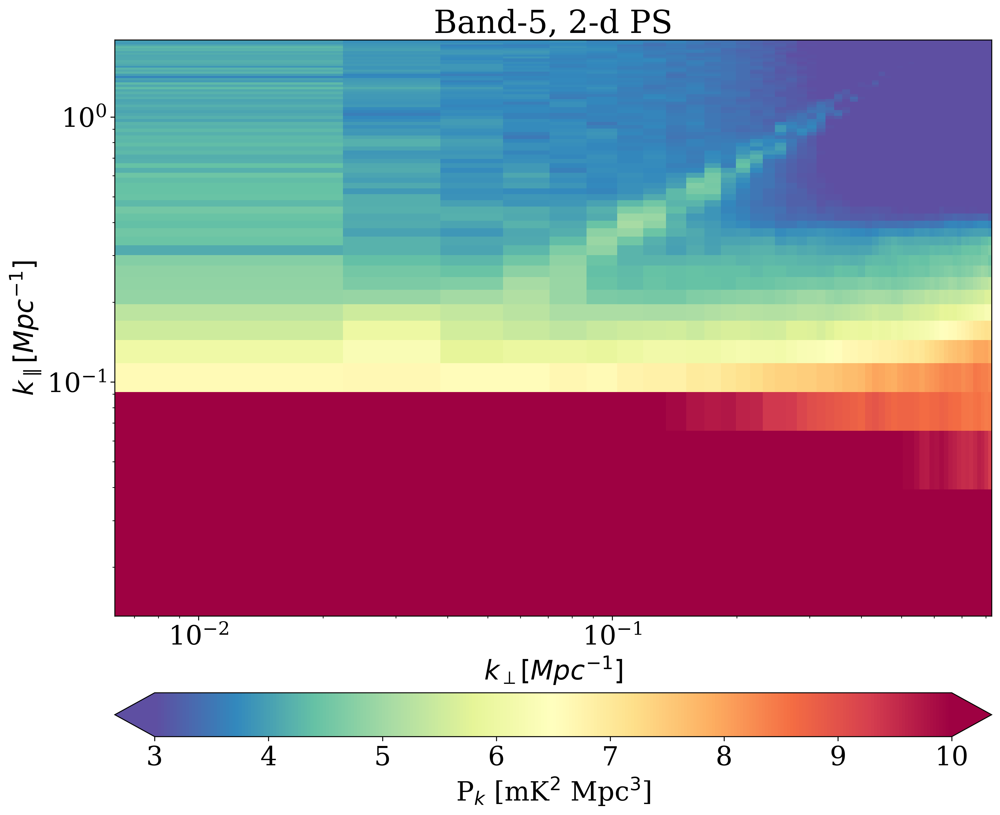

In [50]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=300)

im = ax.pcolormesh(k_perp_og, k_par_og, (np.log10(ps_2D_no_kpar_og*1e6)),cmap = 'Spectral_r',vmin=3,vmax=10)

# plt.plot(k_perp_132_chans,kpar_horizon_100ns_buffer,color='black',lw=2)
# plt.plot(k_perp_132_chans,kpar_horizon,color='black',lw=2,linestyle='--')

cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
ax.set_xscale('log')
ax.set_yscale('log')
plt.title('Band-5, 2-d PS')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
# plt.ylim(k_par_132_chans.min(),k_par_132_chans.max())
plt.tight_layout()
plt.savefig("/scratch/anshuman/Eeshan/RRI_Figures/2dPS_raw_data.png")


In [169]:
# Freq array of the data
freq0 = hdr.get('CRVAL3') # First freq channel value in Hz
chan_res = hdr.get('CDELT3') # chan res in Hz
freq = freq0 + chan_res * (np.arange(nfreq)) # The freq array in Hz
print(f"freq range : {freq[0]/1e6} to {freq[-1]/1e6} MHz")
print(f" Chan res : {chan_res/1e6} MHz")

freq range : 166.0 to 180.9 MHz
 Chan res : 0.1 MHz


In [103]:
kperp,kl,ps_2D,ps_2D_err,k_perp_pca,k_par_pca,ps_2D_no_kpar_pca = powerspec_cross(data_cube_1 =pca_residual_image,
                  data_cube_2 = None,freq =freq,redshift=redshift,wl=wl,
                  chan_res = chan_res,pixel_res=dx,kperp_bins=kperp_bins,kpar_bins=kpar_bins,
                  apply_spectral_window = True,u_min=umin,u_max=umax,Nbins_2D=50,
                  log_bins=False)

Fourier Norm : 2.1882987290360982e-06
Linear size in X-direction = 466.00609471009466 Mpc
Linear size in Y-direction = 466.00609471009466 Mpc
Linear size in Z-direction = 239.8585710317232 Mpc
Power Spectrum normalization factor  value - 52088090.32127382 Mpc^3
volume normalization = 52088090.32127382
correlate the vis cube with itself
Min baseline: 35.0 m, Max baseline: 2000.0 m,z: 7.186776668587896, Wavelength:1.7279104207492795 m
Min bl in wavelength unit: 20.255679680907782,Max bl: 1157.4674103375876
Min kperp: 0.014321108584681842 1 / Mpc, Max kperp: 0.8183490619818196 1 / Mpc
Gridded data cube shape in kx and ky direction - (676, 676)
Cylindrical averaging of real PS
Using unit uniform weighting
(11556,)
Using unit uniform weighting
Using linear binning in k_perp between 0.014321108584681842 and 0.8183490619818196
(11556,)


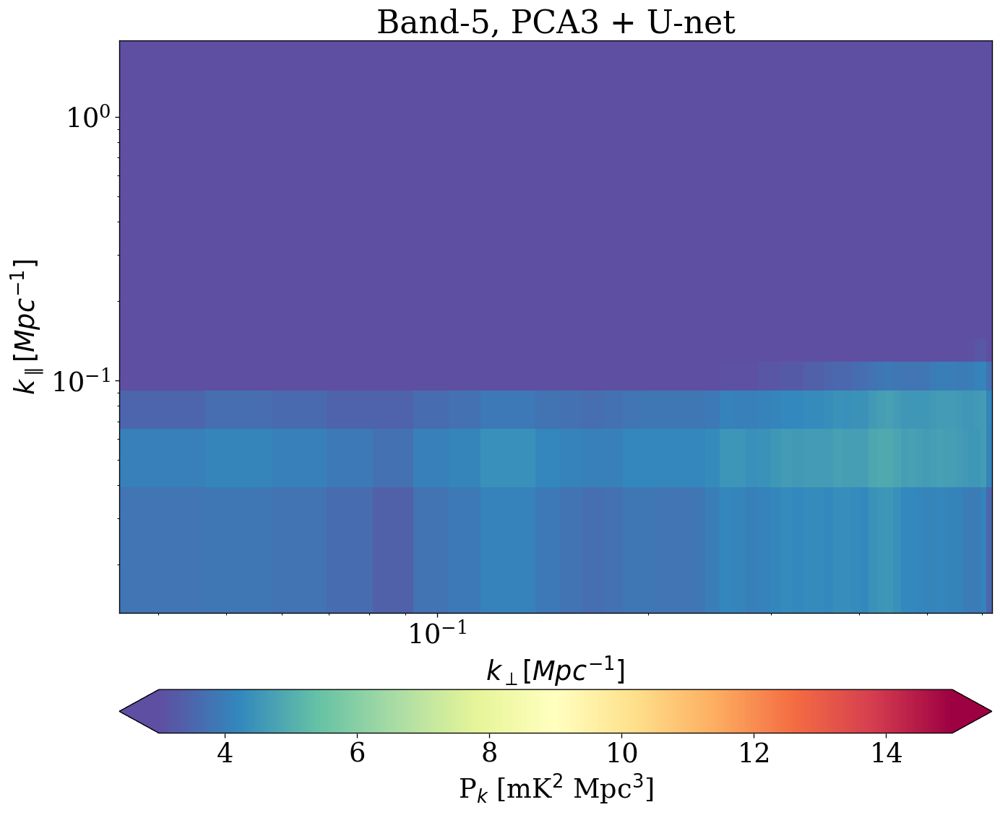

In [106]:
fig, ax = plt.subplots(1, figsize=(12, 10), dpi=120)

im = ax.pcolormesh(k_perp_unet, k_par_unet, (np.log10(ps_2D_no_kpar_unet*1e6)),cmap = 'Spectral_r',vmin=3,vmax=15)

# plt.plot(k_perp_132_chans,kpar_horizon_100ns_buffer,color='black',lw=2)
# plt.plot(k_perp_132_chans,kpar_horizon,color='black',lw=2,linestyle='--')

cbar = fig.colorbar(im, ax=ax, extend='both',pad=0.1, orientation='horizontal')

cbar.ax.minorticks_off()

cbar.set_label(r'P$_{k}$ [mK$^{2}$ Mpc$^{3}$]')
ax.set_xscale('log')
ax.set_yscale('log')
plt.title('Band-5, PCA3 + U-net')
ax.set_xlabel(r'$k_{\perp} [Mpc^{-1}]$')
ax.set_ylabel(r'$k_{\parallel} [Mpc^{-1}]$')
# plt.ylim(k_par_132_chans.min(),k_par_132_chans.max())
plt.tight_layout()
# plt.savefig("132_Chans_PS_no_kpar_res.png")



#CDAE Post-Processing

In [ ]:
decoded_imgs = np.reshape(decoded_imgs,(len(decoded_imgs),decoded_imgs.shape[1],decoded_imgs.shape[2]))

In [ ]:
cart_map_filt_cdae = decoded_imgs[:, idx:-idx, idx:-idx]

In [ ]:
jybeam2k_factor

In [ ]:
idx

In [ ]:
cart_map_filt_cdae.shape

In [ ]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',
                     extent=ext, cmap='Spectral_r')

nu_id = 1

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(cart_map_filt_cdae[nu_id,:,:],vmin=np.min(cart_map_filt_cdae[nu_id,:,:]),vmax=np.max(cart_map_filt_cdae[nu_id,:,:]),**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
# plt.title(f'PB corrected FG filt map, even, central 2deg; Freq = {freq[nu_id]/1e6}',fontsize=16)
plt.colorbar(orientation='vertical',pad=0.02)

In [ ]:
cart_map_filt_cdae_kelvin = cart_map_filt_cdae * jybeam2k_factor[:,None,None]

In [ ]:
cart_map_filt_cdae_kelvin.shape

In [ ]:
ext=(ra[0],ra[-1], dec[0], dec[-1])
imshow_kwargs = dict(aspect='auto', origin='lower', interpolation='nearest',
                     extent=ext, cmap='Spectral_r')

nu_id = 5

plt.figure(figsize=(12,8),dpi=100)
im = plt.imshow(cart_map_filt_cdae_kelvin[nu_id,:,:],**imshow_kwargs)
plt.xlabel("RA [deg]",fontsize=16)
plt.ylabel('DEC [deg]',fontsize=16)
# plt.title(f'Central 2deg FG filt image in k; Freq = {freq[nu_id]/1e6}',fontsize=20)
plt.colorbar(orientation='vertical',pad=0.02)

In [ ]:
data_filt_uv_nu_cdae = image_to_uv(cart_map_filt_cdae_kelvin, window=False,axes=(1,2))

In [ ]:
data_filt_uv_nu_cdae.shape

In [ ]:
apply_spectral_window = True
window_name = 'nuttall'
# nfreq= freq.size
window = windows.get_window(window_name,nfreq)
w = window[:,np.newaxis,np.newaxis]
data_filt_cdae_uv_tau =  np.fft.fftshift(np.fft.ifft(data_filt_uv_nu_cdae * w,axis=0),axes=0)

In [ ]:
w

In [ ]:
data_filt_cdae_corr_real = get_ps(data_filt_cdae_uv_tau,vis_cube_2=data_filt_cdae_uv_tau,vol_norm_factor=(vol_norm))

In [ ]:
data_filt_cdae_corr_real.shape

In [ ]:
u,v,u_min_lambda, u_max_lambda

In [ ]:
data_filt_cdae_corr, uu, vv,  = reshape_data_cube(data_filt_cdae_corr_real,u,v,u_min_lambda, u_max_lambda)

In [ ]:
data_filt_cdae_corr.shape

In [ ]:
# delays = np.fft.fftshift(np.fft.fftfreq(nfreq, d= chan_res)) # * un.s # in s
# tau = delays * 1e6 # in mu-s
# k_parallel = delay_to_kpara(delays * un.s,redshift,cosmo=cosmo)

In [ ]:
delay_id = tau_id

fig = plt.figure(figsize=(16, 12), dpi=100)

im = plt.imshow(np.log10(data_filt_cdae_corr_real[delay_id,:,:]),
                   extent=(kx[0],kx[-1], ky[0], ky[-1]),
                aspect='auto', origin='lower', interpolation='nearest',cmap='magma')
plt.colorbar(im, extend='both',pad=0.1, orientation='horizontal',label='PS')
plt.xlabel(r'kx',fontsize=14)
plt.ylabel(r'ky',fontsize=14)
plt.title(f'Data filt: tau = {np.round(tau[delay_id],2)} micro-sec',fontsize=14)
# plt.ylim(-2,2)
# plt.xlim(-2,2)
plt.tight_layout()
plt.show()

In [ ]:
kperp,kl,ps_filt_cdae_2D,_,_  = PS2D(data_filt_cdae_corr,weight_cube=None,kperp_bins=kperp_bins,
                                    kpar_bins=kpar_bins,
                                    kpar=k_parallel.value, uu = uu, vv = vv,redshift=redshift,
                                    )

In [ ]:
print(ps_filt_2D.shape)
ps_filt_cdae_2D.shape

In [ ]:
# k_perp,k_par,c,_,_ = PS2D_no_kpar_bin(data_filt_cdae_corr,weight_cube=None,
#                     kperp_min=kperp_min.value,kperp_max=kperp_max.value,kpar=k_parallel.value,
#                     uu=uu,vv=vv,redshift=redshift,fold=True,
#                     Nbins_2D=50,log_bins=False)

In [ ]:
# True ps
# ps = np.loadtxt(os.path.join("/project/def-mdobbs/arnab92/SKAD3/test_data","TestDatasetTRUTH_166MHz-181MHz.data"))

In [ ]:
fig = plt.figure(num=1, figsize=(26, 16), dpi=100)

gspec = gridspec.GridSpec(1, 2, wspace=0.05)

plt.subplot(gspec[0, 0])
plt.pcolormesh(kperp_bins, kpar_bins,np.log10((ps_filt_cdae_2D*1e6)),cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.ylabel(r'$k_{\parallel} [Mpc^{-1}]$',fontsize=20)
plt.title(f'Estimated PS, PCA-5 Unet clean',fontsize=24)
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)


plt.subplot(gspec[0, 1])
plt.pcolormesh(kperp_bins, kpar_bins, np.log10((ps*1e6)),cmap = 'Spectral_r')
plt.colorbar(extend='both',pad=0.1,orientation='horizontal')
plt.yticks([])
plt.xlabel(r'$k_{\perp} [Mpc^{-1}]$',fontsize=20)
plt.title(f'True',fontsize=24)


#FTT-CNN

In [ ]:
import numpy as np
x= np.arange(1,13).reshape(2,2,3)
print(x)

In [ ]:
print(np.fft.rfft(x,axis=1))

In [ ]:
print(x[::-1])

In [ ]:
a = np.arange(1,7)
b = np.arange(6,13)
c = np.concatenate((a,b))
print(c)

# HealPy

In [ ]:
pip install healpy

In [ ]:
import healpy as hp
import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
path = '/content/drive/MyDrive/Skao_Image_Data/'
data_u_test = os.path.join(path,'Test_Data_166_181/TestDataset.msn_image.fits')
data_u = os.path.join(path,'ZW3.msn_image.fits')
# data_test_u = os.path.join(path,'Test_Data_166_181/TestDataset.msn_image.fits')
# image_1 = np.array(hdu_test.data[:])
# image_1_shape = hdu_test.data[:].shape
# nfreq1, Nx1, Ny1 = image_1_shape[0], int(0.3*image_1_shape[1]), int(0.3*image_1_shape[2])

In [ ]:
from astropy.io import ascii, fits
hdu = fits.open(data_u)[0]
hdu_test = fits.open(data_u_test)[0]
print('train data shape',hdu.data[:].shape)
print('test data shape',hdu_test.data[:].shape)


In [ ]:
image_shape = hdu.data[:].shape
print('image Shape',image_shape)
print(hdu.data[:][600:610,0,0])
print(hdu_test.data[:][:10,0,0]/1e)

# nfreq, Nx, Ny = image_shape[0], int(0.3*image_shape[1]), int(0.3*image_shape[2])
# image =  hdu.data[:][:,:Nx,:Ny]
# # image = np.reshape(image,(nfreq,Nx*Ny))
# # image = np.swapaxes(image,0,1)


In [ ]:
# Set the number of sources and the coordinates for the input
nsources = int(1e7)
nside = 64
npix = hp.nside2npix(nside)
print(f'npix',npix)

# Coordinates and the density field f
thetas = np.random.uniform(0, np.pi, nsources)
phis = np.random.uniform(0, 2*np.pi, nsources)
fs = np.random.randn(nsources)

print('thetas',thetas.shape)
print('phis',phis.shape)



# Go from HEALPix coordinates to indices
indices = hp.ang2pix(nside, thetas, phis)

# # Baseline, from Daniel Lenz's answer:
# # time: ~5 s
# hpxmap1 = np.zeros(npix, dtype=np.float)
# for i in range(nsources):
#     hpxmap1[indices[i]] += fs[i]

# # Using numpy.add.at
# # time: ~0.6 ms
# hpxmap2 = np.zeros(npix, dtype=np.float)
# np.add.at(hpxmap2, indices, fs)

In [ ]:
NSIDE = 19
print(
    "Approximate resolution at NSIDE {} is {:.2} deg".format(
        NSIDE, hp.nside2resol(NSIDE, arcmin=True) / 60
    )
)

In [ ]:
NPIX = hp.nside2npix(591)
print(NPIX)

In [ ]:
m = np.arange(NPIX)
hp.mollview(image[:NPIX,100], title="Mollview image RING")
hp.graticule()

In [ ]:
for i in range len(m):
  m

In [ ]:
Sky_Map_I = hp.fitsfunc.read_map(data_u,hdu=0)

In [ ]:
image_1.shape

In [ ]:
nfreq, Nx, Ny = np.shape(image_1)[0], np.shape(image_1)[1], np.shape(image_1)[2]

In [ ]:
image_1=np.reshape(image_1,(nfreq,Nx*Ny))
image_1=np.swapaxes(image_1,0,1)


In [ ]:
image_1.shape

In [ ]:
hp.mollview(
    image_1[:NPIX+1],
    coord=["G", "E"],
    title="Histogram equalized Ecliptic",
    unit="mK",
    norm="hist",
)
hp.graticule()

In [ ]:
hp.visufunc.cartview(
    image[:NPIX,0],
)

In [ ]:
arr1 = np.array([[1,2],[3,4]])
arr2 = np.array([[5,6],[7,8]])
print(arr1.shape)
print(arr2.shape)
arr1 = np.concatenate((arr1.reshape((1,arr1.shape[0],arr1.shape[1])),arr2.reshape((1,arr2.shape[0],arr2.shape[1]))))
print(arr1.shape)
print(arr1)